# Setup

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.collections import LineCollection
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering
from collections import Counter
from sklearn.metrics import silhouette_score, silhouette_samples
import scipy
import matplotlib.ticker as tick

plt.rcParams.update(plt.rcParamsDefault)
new_rc_params = {'text.usetex': False, "svg.fonttype": 'none'}
plt.rcParams.update(new_rc_params)

sns.set_style({'font.family':'sans-serif', 'font.sans-serif':'Arial'})
plt.rcParams['font.sans-serif'] = "Arial"
plt.rcParams['font.family'] = "sans-serif"
plt.rcParams['pdf.fonttype'] = 42

#copied from https://dfrieds.com/data-visualizations/how-format-large-tick-values.html
def reformat_large_tick_values(tick_val, pos):
    """
    Turns large tick values (in the billions, millions and thousands) such as 4500 into 4.5K and also appropriately turns 4000 into 4K (no zero after the decimal).
    """
    if tick_val >= 1000000000:
        val = round(tick_val/1000000000, 1)
        new_tick_format = '{:}B'.format(val)
    elif tick_val >= 1000000:
        val = round(tick_val/1000000, 1)
        new_tick_format = '{:}M'.format(val)
    elif tick_val >= 1000:
        val = round(tick_val/1000, 1)
        new_tick_format = '{:}'.format(val)
    elif tick_val < 1000:
        new_tick_format = round(tick_val, 1)
    else:
        new_tick_format = tick_val

    # make new_tick_format into a string value
    new_tick_format = str(new_tick_format)
    
    # code below will keep 4.5M as is but change values such as 4.0M to 4M since that zero after the decimal isn't needed
    index_of_decimal = new_tick_format.find(".")
    
    if index_of_decimal != -1:
        value_after_decimal = new_tick_format[index_of_decimal+1]
        if value_after_decimal == "0":
            # remove the 0 after the decimal point since it's not needed
            new_tick_format = new_tick_format[0:index_of_decimal] + new_tick_format[index_of_decimal+2:]
            
    return new_tick_format

# Generate Mfuzz format multicov using Mikado annotation
Run this to add Mikado gene names to the multicov table.

In [2]:
generate_summarybed = False
generate_nearestbed = False
generate_Mfuzz_format = False

mikado_gffloc = '~/Labwork/Bioinformatics/Transcripts/' + 'mikado.loci.sorted.gff'
mikado_transcripts_gffloc = '~/Labwork/Bioinformatics/Transcripts/' + 'mikado.loci.sorted.transcripts.gff'
mikado_transcripts_bedloc = '~/Labwork/Bioinformatics/Transcripts/' + 'mikado.loci.sorted.transcripts.bed'
omnipeak_bedloc = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/' + 'OmniATAC_bothruns_q005_allpeaks.metrics.bed'
nearestgenetopeakloc = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/' + 'OmniATAC_bothruns_q005_allpeaks.nearestmikado.tsv'
multicovloc = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/' + 'OmniATAC_bothruns_multicov_forDESeq.tsv'
mikadomulticovloc = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/' + 'OmniATAC_bothruns_multicov_mfuzz_mikado.tsv'
unformatmulticovloc = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/' + 'OmniATAC_bothruns_multicov_unformat_mikado.tsv'

times = [72, 77, 80, 87, 90, 96, 104, 112, 120, 132, 144, 155, 168, 180, 192]

if generate_summarybed:
    annotation = pd.DataFrame(pd.read_csv(mikado_gffloc, sep='\t', header = None))
    mRNAs = annotation[annotation[8].astype(str).apply(lambda x: 'Parent' in x) & (annotation[2] == 'mRNA')]
    ncRNAs = annotation[annotation[8].astype(str).apply(lambda x: 'Parent' in x) & (annotation[2] == 'ncRNA')]

    transcripts = mRNAs.append(ncRNAs)
    transcripts.sort_index(inplace = True)
    transcripts.to_csv(mikado_transcripts_gffloc, sep='\t', header = None, index = None)

    #need to run the following line on the shell in the correct folder:
    #gff2bed < mikado.loci.sorted.transcripts.gff > mikado.loci.sorted.transcripts.bed

if generate_nearestbed:
    !/usr/local/bin/bedtools closest -D a -t first -a {omnipeak_bedloc} -b {mikado_transcripts_bedloc} > {nearestgenetopeakloc}
    
#load in nearest gene bedtools closest result
nearestgenetopeakdf = pd.DataFrame(pd.read_csv(nearestgenetopeakloc, sep = '\t', header = None))

#generate columns for GENE.ID and GENE.NAME
nearestgenetopeakdf['GENE.ID'] = nearestgenetopeakdf[0].astype(str) + '_' + nearestgenetopeakdf[1].astype(str) + '_' + nearestgenetopeakdf[2].astype(str)
nearestgenetopeakdf['GENE.NAME'] = nearestgenetopeakdf[13].astype(str)

display(nearestgenetopeakdf)

#load in multicov table
multicovdf = pd.DataFrame(pd.read_csv(multicovloc, sep = '\t'))

#extract GENE.ID and GENE.NAME
nameid = nearestgenetopeakdf[['GENE.ID', 'GENE.NAME']]

#merge dataframes
mergeddf = nameid.merge(multicovdf, left_on = 'GENE.ID', right_on = 'contig_start_end')
mergeddf = mergeddf.drop(columns= 'contig_start_end')

mergeddf['empty'] = mergeddf.sum(axis = 1, numeric_only = True)
mergeddf = mergeddf[mergeddf['empty'] != 0]
mergeddf = mergeddf.drop(columns = 'empty')

if generate_Mfuzz_format:
    mergeddf.to_csv(unformatmulticovloc, sep = '\t', index = None)
    
    #generate first row with correct format information
    data = ['TIME', ''] + [i for i in times for j in np.arange(2)]
    dictzip = dict(zip(mergeddf.columns, data))
    headerdf = pd.DataFrame(dictzip, index = [0])
    
    #append data to first row
    finaldf = headerdf.append(mergeddf)
    display(len(mergeddf), len(finaldf))
    display(finaldf)
    
    finaldf.to_csv(mikadomulticovloc, sep = '\t', index = None)

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,GENE.ID,GENE.NAME
0,phaw_50.000003,4302,5642,15,1000.000000,2054.581486,11.055425,8.578344,7.869445,5.871578,...,.,.,.,.,.,.,.,-1,phaw_50.000003_4302_5642,.
1,phaw_50.000009,11628,11888,1,1000.000000,269.657501,5.010030,5.010030,2.950491,2.950491,...,mikado.phaw_50.000009G1.1,19.0,+,Mikado_loci,mRNA,.,ID=mikado.phaw_50.000009G1.1;Parent=mikado.pha...,-1116,phaw_50.000009_11628_11888,mikado.phaw_50.000009G1.1
2,phaw_50.000014,206406,207519,15,1000.000000,1376.176314,10.238941,7.131846,7.024645,4.676017,...,mikado.phaw_50.000014G4.1,20.0,-,Mikado_loci,mRNA,.,ID=mikado.phaw_50.000014G4.1;Parent=mikado.pha...,0,phaw_50.000014_206406_207519,mikado.phaw_50.000014G4.1
3,phaw_50.000014,238984,239410,3,1000.000000,403.039642,6.473408,5.290580,4.100616,3.178571,...,mikado.phaw_50.000014G4.1,20.0,-,Mikado_loci,mRNA,.,ID=mikado.phaw_50.000014G4.1;Parent=mikado.pha...,-25583,phaw_50.000014_238984_239410,mikado.phaw_50.000014G4.1
4,phaw_50.000014,239711,240244,12,944.500000,766.406303,7.610405,4.299145,5.012049,2.249521,...,mikado.phaw_50.000014G4.1,20.0,-,Mikado_loci,mRNA,.,ID=mikado.phaw_50.000014G4.1;Parent=mikado.pha...,-26310,phaw_50.000014_239711_240244,mikado.phaw_50.000014G4.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190073,phaw_50.283875b,1535466,1535680,2,1000.000000,223.467064,5.899739,5.556468,3.640883,3.383217,...,mikado.phaw_50.283875bG13.1,17.0,-,Mikado_loci,mRNA,.,ID=mikado.phaw_50.283875bG13.1;Parent=mikado.p...,-16091,phaw_50.283875b_1535466_1535680,mikado.phaw_50.283875bG13.1
190074,phaw_50.283875b,1546841,1547714,13,926.461538,1193.281705,11.164510,4.852245,8.145149,2.655820,...,mikado.phaw_50.283875bG13.1,17.0,-,Mikado_loci,mRNA,.,ID=mikado.phaw_50.283875bG13.1;Parent=mikado.p...,-27466,phaw_50.283875b_1546841_1547714,mikado.phaw_50.283875bG13.1
190075,phaw_50.283875b,1548468,1548807,1,1000.000000,384.672821,5.473580,5.473580,3.372366,3.372366,...,mikado.phaw_50.283875bG13.1,17.0,-,Mikado_loci,mRNA,.,ID=mikado.phaw_50.283875bG13.1;Parent=mikado.p...,-29093,phaw_50.283875b_1548468_1548807,mikado.phaw_50.283875bG13.1
190076,phaw_50.283876,1905,3313,15,1000.000000,3321.552816,11.202005,8.831523,7.825217,6.172129,...,mikado.phaw_50.283876G1.1,20.0,-,Mikado_loci,mRNA,.,ID=mikado.phaw_50.283876G1.1;Parent=mikado.pha...,0,phaw_50.283876_1905_3313,mikado.phaw_50.283876G1.1


# Display cluster overlap matrices

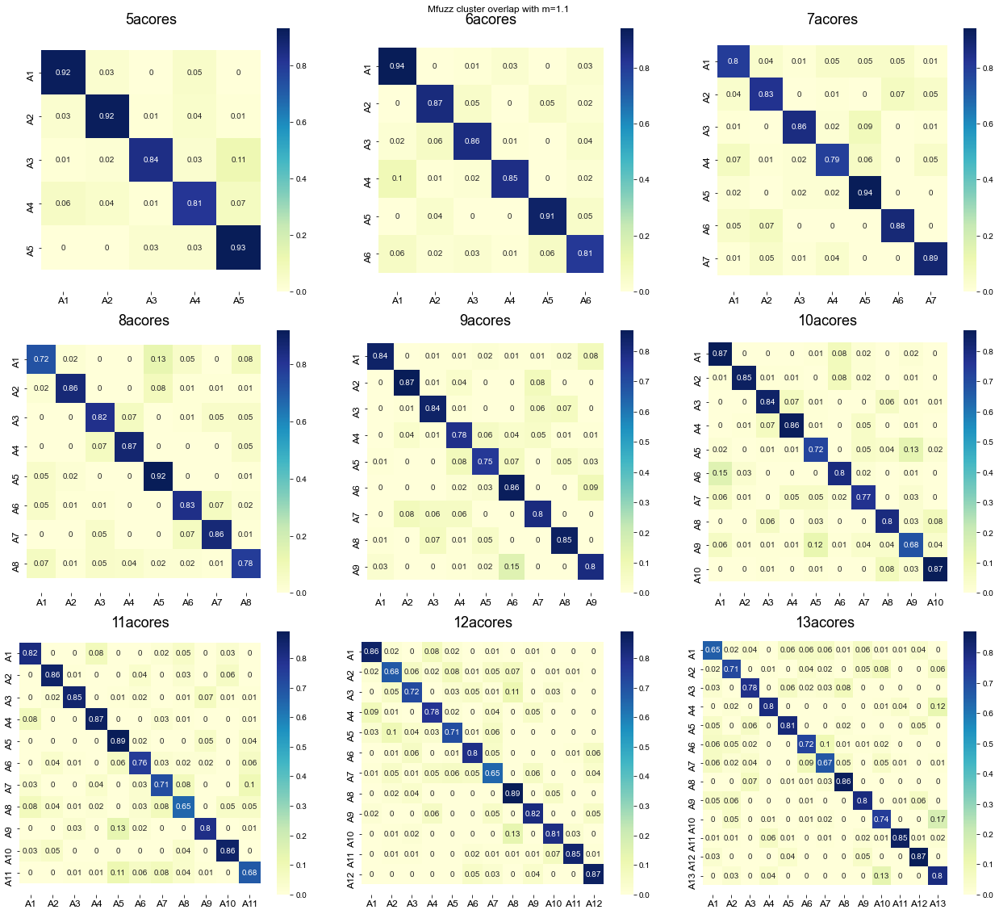

In [33]:
#Set global variables
acores_min = 5
acores_max = 13
mvalue = 1.1

plot_overlap_matrices = True
save_plot = True
fmt = 'pdf'

acores_range = np.arange(acores_min, acores_max + 1)
Mfuzz_dir = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/Mfuzz_mikado/'

if plot_overlap_matrices:
    plt.figure(figsize=(18, 16))
    plt.suptitle('Mfuzz cluster overlap with m=' + str(mvalue))
    for i in acores_range:
        filename = Mfuzz_dir + 'Mfuzz_a**_m*_*_overlap.txt'.replace('**', str(i)).replace('*_*', str(mvalue))
        mfuzz_cmeans_overlap = pd.DataFrame(pd.read_csv(filename, sep = ' '))
        mfuzz_cmeans_overlap = mfuzz_cmeans_overlap.transpose().round(2)
        mfuzz_cmeans_overlap.columns = ['A' + str(i) for i in np.arange(1, i + 1)]
        mfuzz_cmeans_overlap.index = ['A' + str(i) for i in np.arange(1, i + 1)]
        plt.subplot(3, 3, i - acores_min + 1)
        plt.title(str(i) + 'acores', fontsize = 18)
        # fix for mpl bug that cuts off top/bottom of seaborn viz
        
        sns.heatmap(mfuzz_cmeans_overlap, square = True, annot = True, cmap='YlGnBu')
        b, t = plt.ylim() # discover the values for bottom and top
        b += 0.5 # Add 0.5 to the bottom
        t -= 0.5 # Subtract 0.5 from the top
        plt.ylim(b, t) # update the ylim(bottom, top) values
        plt.yticks(fontsize = 12)
        plt.xticks(fontsize = 12)
    
    plt.tight_layout()    
    if save_plot:
        plt.savefig("Mfuzz_clusteroverlaps_" + str(acores_min) + '-' + str(acores_max) + 'acores_matrices.' + fmt)
    plt.show()

# Visualize silhouette scores and plots

For acores = 5 The average silhouette_score is : 0.8522082748057624
For acores = 6 The average silhouette_score is : 0.8402487409796868
For acores = 7 The average silhouette_score is : 0.8177108171316829
For acores = 8 The average silhouette_score is : 0.7864862769086729
For acores = 9 The average silhouette_score is : 0.7543918352566105
For acores = 10 The average silhouette_score is : 0.7500975924995898
For acores = 11 The average silhouette_score is : 0.7460464786001517
For acores = 12 The average silhouette_score is : 0.7372640425076019
For acores = 13 The average silhouette_score is : 0.7077274884964285


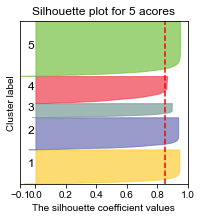

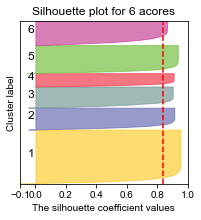

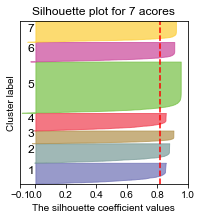

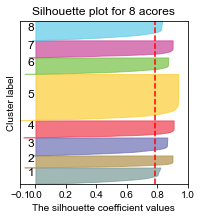

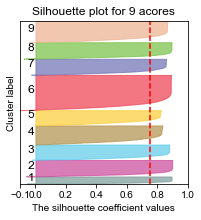

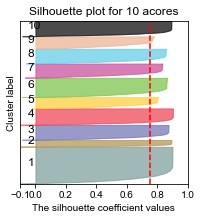

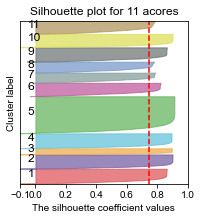

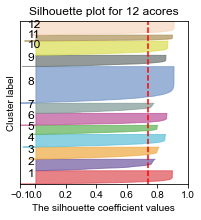

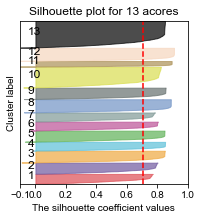

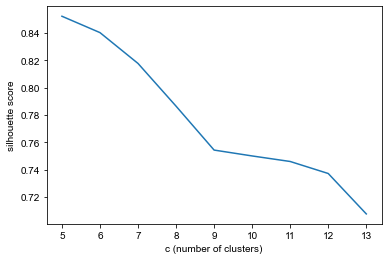

In [34]:
#Set global variables
acores_min = 5
acores_max = 13
mvalue = 1.1

plot_silhouette = True
plot_silhouette_line = True
save_plot = True
fmt = 'pdf'

acores_range = np.arange(acores_min, acores_max + 1)
Mfuzz_dir = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/Mfuzz_mikado/'

rand_n = 10000
perplexity = 100

colors_dict = {
        5: ['#fccd35', '#6d6fb4', '#789a97', '#ef3d4f', '#75c043'],
        6: ['#fccd35', '#6d6fb4', '#789a97', '#ef3d4f', '#75c043', '#ca4699'],
        7: ['#6d6fb4', '#789a97', '#b1914c', '#ef3d4f', '#75c043', '#ca4699', '#fccd35'],
        8: ['#789a97', '#b1914c', '#6d6fb4', '#ef3d4f', '#fccd35', '#75c043', '#ca4699', '#5dcae8'],
        9: ['#789a97',
 '#ca4699',
 '#5dcae8',
 '#b1914c',
 '#fccd35',
 '#ef3d4f',
 '#6d6fb4',
 '#75c043',
 '#ecb18e'],
        10: ['#789a97', '#b1914c', '#6d6fb4', '#ef3d4f', '#fccd35', '#75c043', '#ca4699', '#5dcae8', '#ecb18e', '#000000'],
        11: ['#dd4d54', '#70599f', '#efa941', '#5cbfd8', '#5fb157', '#bb5196', '#7f9996', '#7193c5', '#66706e', '#d9dd50', '#ac9156'],
        12: ['#dd4d54', '#70599f', '#efa941', '#5cbfd8', '#5fb157', '#bb5196', '#7f9996', '#7193c5', '#66706e', '#d9dd50', '#ac9156', '#f6d6be'],
        13: ['#dd4d54', '#70599f', '#efa941', '#5cbfd8', '#5fb157', '#bb5196', '#7f9996', '#7193c5', '#66706e', '#d9dd50', '#ac9156', '#f6d6be', '#000000']
}

if plot_silhouette == True:
    silhouette_avgs = []
    for acores in acores_range:
        filename = Mfuzz_dir + 'Mfuzz_a**_m*_*_clusters.tsv'.replace('**', str(acores)).replace('*_*', str(mvalue))
        mfuzz_cmeans = pd.DataFrame(pd.read_csv(filename))
        mfuzz_cmeans_val = mfuzz_cmeans.filter(regex=("cluster.*"))
        mfuzz_cmeans['best_cluster'] = mfuzz_cmeans_val.idxmax(axis = 1).str.split('.', expand = True)[1].astype(int)
        mfuzz_cmeans['topval'] = mfuzz_cmeans_val.max(axis = 1)
        mfuzz_cmeans = mfuzz_cmeans.sample(rand_n, axis = 'rows', random_state = 94703)
        # Create a subplot with 1 row and 1 column
        fig, ax1 = plt.subplots(1, 1)
        fig.set_size_inches(3, 3)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(mfuzz_cmeans) + (acores + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        mfuzz_cmeans_dist = mfuzz_cmeans[[col for col in mfuzz_cmeans if col.startswith('cluster.')]]
        mfuzz_cmeans_label = mfuzz_cmeans['best_cluster']

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(mfuzz_cmeans_dist, mfuzz_cmeans_label)
        print("For acores =", acores,
              "The average silhouette_score is :", silhouette_avg)
        
        silhouette_avgs = silhouette_avgs + [silhouette_avg]

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(mfuzz_cmeans_dist, mfuzz_cmeans_label)
        
        y_lower = 10
        for i in range(1, acores + 1):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[mfuzz_cmeans_label == i]

            ith_cluster_silhouette_values.sort()
    
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
    
            #color = cm.nipy_spectral(float(i) / acores)
            color = colors_dict[acores][i - 1]
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i), fontsize = 12)

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("Silhouette plot for " + str(acores) + " acores")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        
        if save_plot:
            plt.savefig("Mfuzz_silhouette_" + str(acores_min) + '-' + str(acores_max) + '_' + str(acores) + 'acores_silhouette.' + fmt)
    plt.show()
    

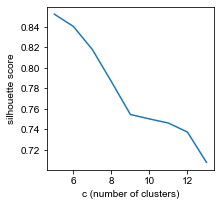

In [35]:
if plot_silhouette_line:
    plt.figure(figsize=(3,3))
    plt.plot(acores_range, silhouette_avgs)
    plt.xlabel('c (number of clusters)')
    plt.ylabel('silhouette score')
    
    if save_plot:
            plt.savefig("Mfuzz_silhouettes_" + str(acores_min) + '-' + str(acores_max) + 'acores_silhouette_line.' + fmt)

# Generate individual list files for each acore

In [4]:
#Takes the Mfuzz cmeans acores file and breaks into separate lists
acores = 9
mvalue = 1.1

lines = ''
hard_Mfuzz_dir = '/Users/dennis/Labwork/Bioinformatics/Omni-ATAC-Seq/Mfuzz_mikado/'
filename = hard_Mfuzz_dir + 'Mfuzz_a**_m*_*_cores.txt'.replace('**', str(acores)).replace('*_*', str(mvalue))
name_generator = hard_Mfuzz_dir + 'Mfuzz_a**_m*_*_cores_!!!acore.txt'.replace('**', str(acores)).replace('*_*', str(mvalue))

with open(filename) as v:
    lines = v.readlines()
    indices = [i for i, x in enumerate(lines) if x == "CLUSTER NUMBER\n"]
    pairs = [[indices[i], indices[i+1]] if i < len(indices) - 1 else [indices[i], -1] for i in np.arange(0, len(indices))]
    
    dictionary = {}
    for rnge in pairs:
        dictionary['_'.join(str(v) for v in rnge)] = lines[rnge[0]:rnge[1]]
    
    i = 1
    for item in dictionary:
        with open(str(i).join(name_generator.split('!!!')), 'w+') as outfile:
            for line in dictionary[item]:
                outfile.write(line)
        i = i + 1

# Merge max impulse fit data with acore lists

In [5]:
name_generator2 = [str(i).join(name_generator.split('!!!')) for i in np.arange(1, acores +1)]

multicov = pd.DataFrame(pd.read_csv(unformatmulticovloc, sep = '\t'))
impulseDE2_sig = pd.DataFrame(pd.read_csv("~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/" + "OmniATAC-Seq_bothruns_ImpulseDE2_sigstable_max_thpf.tsv", sep = '\t'))

hist_dict = {}

groups_dict = {}
genelist_dict = {}
hist_dict = {}
uniq_dict = {}
all_list = []

for file in name_generator2:
    group_num = file.split('_')[-1].split('.')[0]
    groups_dict[group_num] = pd.read_csv(file, skiprows = 3, header = None, sep = ' ')
    groups_dict[group_num] = groups_dict[group_num].merge(impulseDE2_sig, left_on = 0, right_on = 'contig_start_end')
    genelist_dict[group_num] = groups_dict[group_num]['contig_start_end'].unique()
    hist_dict[group_num] = list(groups_dict[group_num]['stage_all'].values) + [13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
    print(len(hist_dict[group_num]) - 15, 'peaks in', group_num)
    uniq_dict[group_num] = len(groups_dict[group_num]['stage_all'].unique())
    all_list = all_list + list(groups_dict[group_num]['contig_start_end'].unique())

6418 peaks in 1acore
18112 peaks in 2acore
16753 peaks in 3acore
15251 peaks in 4acore
11639 peaks in 5acore
34200 peaks in 6acore
17618 peaks in 7acore
16030 peaks in 8acore
21873 peaks in 9acore


# Plot overlapping histogram of all acore max fits

{'1acore': 19.316337634074305,
 '2acore': 26.57235063717107,
 '3acore': 22.391459923664122,
 '4acore': 23.881763395781476,
 '5acore': 18.614381328299295,
 '6acore': 13.99508987286278,
 '7acore': 24.841490387341917,
 '8acore': 20.89741352446245,
 '9acore': 14.207693713450292}

['#75c043',
 '#b1914c',
 '#6d6fb4',
 '#ca4699',
 '#fccd35',
 '#ef3d4f',
 '#789a97',
 '#5dcae8',
 '#ecb18e']

{5: 'Cluster 1',
 8: 'Cluster 2',
 4: 'Cluster 3',
 0: 'Cluster 4',
 7: 'Cluster 5',
 2: 'Cluster 6',
 3: 'Cluster 7',
 6: 'Cluster 8',
 1: 'Cluster 9'}

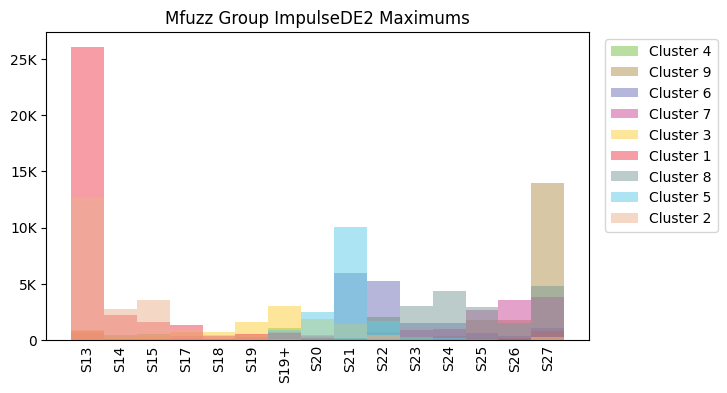

In [6]:
plot_overlap_hist = True
plot_sep_hist = True

#Takes the Mfuzz cmeans acores file and breaks into separate lists
acores = 9
mvalue = 1.1

plt.style.use('default')

def color_orderer(average_dict, color_order):
    values = list(average_dict.values())
    sorted_values = sorted(list(average_dict.values()))
    value_order = [values.index(i) for i in sorted_values]
    colors = [None] * 9
    j = 0
    for i in value_order:
        colors[i] = color_order[j]
        j += 1
    return(value_order, colors)

solved_color_order = []
value_order = []
cluster_names = {}
stage_labels = ['S13', 'S14', 'S15', 'S17', 'S18', 'S19', 'S19+', 'S20', 'S21', 'S22', 'S23', 'S24', 'S25', 'S26', 'S27']

if plot_overlap_hist:

    hists = plt.figure(figsize=(7, 4))
    average_dict = {i: np.mean(hist_dict[i]) for i in hist_dict}
    color_order = ['#ef3d4f', '#ecb18e', '#fccd35', '#75c043', '#5dcae8', '#6d6fb4', '#ca4699', '#789a97', '#b1914c']
    display(average_dict)
    
    solved_color_order, value_order = color_orderer(average_dict, color_order)[1], color_orderer(average_dict, color_order)[0]
    display(solved_color_order)
    
    #maps acore number to ordered "Cluster" number for ease of downstream interpretability/ visualization
    cluster_names = dict(zip(value_order, ['Cluster ' + str(i) for i in np.arange(1, len(value_order) + 1)]))
    display(cluster_names)
    
    colors_dict = {9: solved_color_order}

    colors = colors_dict[acores]
    for lst in hist_dict:
        group_num = lst.replace('acore', '')
        (n, bins, patches) = plt.hist(hist_dict[lst], bins=15, alpha=0.5, label=cluster_names[int(group_num) - 1], color = colors[int(group_num)-1])
        plt.legend(loc = 'upper right', bbox_to_anchor=(1.25, 1))
        plt.title('Mfuzz Group ImpulseDE2 Maximums')
        xtick_positions = [bins[i] + 0.5 * (bins[1] - bins[0]) for i in np.arange(len(bins) - 1)]
    plt.tick_params(axis='x', which='both', length=0)
    plt.xticks(xtick_positions, stage_labels, rotation = 'vertical')
    ax = plt.gca()
    ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))  

    #plt.savefig(Mfuzz_folder_loc + "Mfuzz_" + str(acores) + "_group_hist_" + suffix + ".svg", bbox = 'tight')

# Plot individual histograms of acore max fits

['#789a97',
 '#ca4699',
 '#5dcae8',
 '#b1914c',
 '#fccd35',
 '#ef3d4f',
 '#6d6fb4',
 '#75c043',
 '#ecb18e']

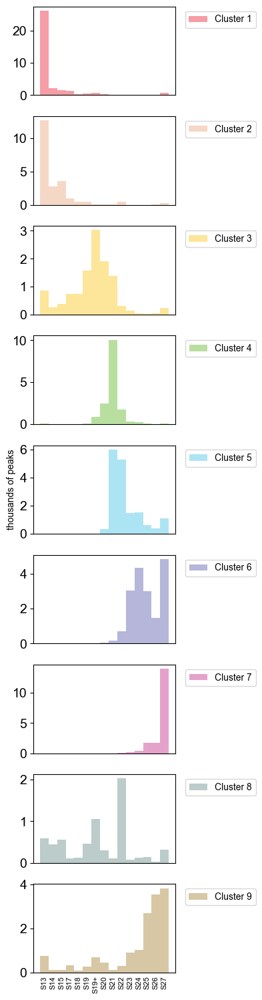

In [23]:
acores = 9
mvalue = 1.1

save_fig = True
fmt = ".pdf"

#Use this format to get the color orders correct, separating out the original clusters
#so that the two odd acores (1 and 4) are colored separately
###############
cluster_names = {5: 'Cluster 1',
                 8: 'Cluster 2',
                 4: 'Cluster 3',
                 7: 'Cluster 4',
                 2: 'Cluster 5',
                 6: 'Cluster 6',
                 1: 'Cluster 7',
                 0: 'Cluster 8',
                 3: 'Cluster 9'}
value_order = cluster_names.keys()
color_order = ['#ef3d4f', '#ecb18e', '#fccd35', '#75c043', '#5dcae8', '#6d6fb4', '#ca4699', '#789a97', '#b1914c']
colors = [None] * 9

j = 0
for i in value_order:
    colors[i] = color_order[j]
    j += 1

display(colors)
    
###############

if plot_sep_hist:
    hists = plt.figure(figsize=(4, 15))
    
    i = 1
    for value in value_order:
        lst = str(value + 1) + 'acore'
        group_num = lst.replace('acore', '')
        plt.subplot(9, 1, i)
        plt.tight_layout()
        plt.hist(hist_dict[lst], bins=15, alpha=0.5, label=cluster_names[int(group_num) - 1], color = colors[int(group_num)-1])
        plt.legend(loc = 'upper right', bbox_to_anchor = (1.6, 1))
        xtick_positions = [bins[i] + 0.5 * (bins[1] - bins[0]) for i in np.arange(len(bins) - 1)]
        plt.yticks(fontsize = 14)
        plt.xticks(xtick_positions, stage_labels, rotation = 'vertical', fontsize = 8)
        if i == 5:
            plt.ylabel('thousands of peaks')
        if i < 9:
            plt.xticks([], [])
        plt.tick_params(axis='x', which='both', length=0)
        ax = plt.gca()
        ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
        i += 1
        
if save_fig:
    plt.savefig("Mfuzz_" + str(acores) + "acores_group_hist_separated_new." + fmt)

# Calculate best cluster per peak

In [19]:
acores = 9
mvalue = 1.1

multicovloc = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/' + 'OmniATAC_bothruns_multicov_unformat_mikado.tsv'

name_generator_3 = hard_Mfuzz_dir + 'Mfuzz_a**_m*_*_clusters.tsv'.replace('**', str(acores)).replace('*_*', str(mvalue))

mfuzz_cmeans = pd.DataFrame(pd.read_csv(name_generator_3))
mfuzz_cmeans_val = mfuzz_cmeans.filter(regex=("cluster.*"))
mfuzz_cmeans['best_cluster'] = mfuzz_cmeans_val.idxmax(axis = 1).str.split('.', expand = True)[1].astype(int)
mfuzz_cmeans['topval'] = mfuzz_cmeans_val.max(axis = 1)
display(mfuzz_cmeans)

standardizedloc = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/' +  'OmniATAC_bothruns_multicov_mfuzz_mikado_standardised.tsv'

multicov = pd.DataFrame(pd.read_csv(standardizedloc, sep = '\t'))
multicov.index = mfuzz_cmeans['gene.id']
multicov['best_cluster'] = mfuzz_cmeans['best_cluster'].values
multicov['topval'] = mfuzz_cmeans['topval'].values
display(multicov)

,Unnamed: 0,gene.id,gene.names,cluster.1,cluster.2,cluster.3,cluster.4,cluster.5,cluster.6,cluster.7,cluster.8,cluster.9,best_cluster,topval
0,phaw_50.000003_4302_5642,phaw_50.000003_4302_5642,.,1.489119e-10,1.658498e-12,3.066869e-13,2.851760e-07,7.152653e-07,9.999548e-01,3.510698e-12,4.314979e-12,4.419069e-05,6,0.999955
1,phaw_50.000009_11628_11888,phaw_50.000009_11628_11888,mikado.phaw_50.000009G1.1,2.249265e-01,6.136322e-03,6.524058e-04,3.272255e-01,1.256240e-01,1.449655e-01,3.360334e-03,1.367315e-03,1.657422e-01,4,0.327226
2,phaw_50.000014_206406_207519,phaw_50.000014_206406_207519,mikado.phaw_50.000014G4.1,1.985215e-12,9.815418e-17,7.367725e-17,9.331935e-13,4.650654e-10,9.999604e-01,1.299604e-16,3.779018e-15,3.957906e-05,6,0.999960
3,phaw_50.000014_238984_239410,phaw_50.000014_238984_239410,mikado.phaw_50.000014G4.1,7.220162e-02,2.265438e-04,9.599721e-04,1.344768e-02,5.659657e-01,1.325753e-01,1.524165e-04,4.607045e-02,1.684002e-01,5,0.565966
4,phaw_50.000014_239711_240244,phaw_50.000014_239711_240244,mikado.phaw_50.000014G4.1,2.040459e-03,5.007315e-04,3.314377e-04,4.409588e-01,3.050751e-01,2.142652e-01,4.040285e-03,1.280701e-03,3.150739e-02,4,0.440959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181405,phaw_50.283875b_1496273_1496592,phaw_50.283875b_1496273_1496592,mikado.phaw_50.283875bG12.1,4.187937e-07,9.996280e-01,5.678566e-07,9.111347e-05,8.583512e-08,2.423140e-07,2.794642e-04,2.243153e-08,1.202253e-07,2,0.999628
181406,phaw_50.283875b_1535466_1535680,phaw_50.283875b_1535466_1535680,mikado.phaw_50.283875bG13.1,2.192718e-10,9.998430e-01,3.131999e-08,3.756821e-06,6.621292e-10,2.528074e-10,1.532040e-04,3.785229e-10,6.971840e-11,2,0.999843
181407,phaw_50.283875b_1546841_1547714,phaw_50.283875b_1546841_1547714,mikado.phaw_50.283875bG13.1,3.398675e-11,5.127871e-10,9.999977e-01,1.945234e-10,4.921034e-11,3.710168e-13,5.971324e-07,1.735587e-06,2.760541e-13,3,0.999998
181408,phaw_50.283876_1905_3313,phaw_50.283876_1905_3313,mikado.phaw_50.283876G1.1,4.286039e-13,8.145032e-17,2.537475e-17,9.091705e-13,8.307310e-11,9.998960e-01,8.670674e-17,7.703869e-16,1.040109e-04,6,0.999896


,S13A,S13B,S14A,S14B,S15A,S15B,S17A,S17B,S18A,S18B,...,S24A,S24B,S25A,S25B,S26A,S26B,S27A,S27B,best_cluster,topval
gene.id,,,,,,,,,,,,,,,,,,,,,
phaw_50.000003_4302_5642,1.280766,3.321805,0.276840,1.148015,1.264172,0.011339,0.202168,0.426184,0.011339,1.181203,...,0.094308,0.152387,-0.046739,-0.801758,0.069417,-0.610929,-1.365947,-0.801758,6,0.999955
phaw_50.000009_11628_11888,-0.184115,1.024140,-1.219763,2.146092,0.074797,0.678925,0.161101,1.455660,0.333709,0.074797,...,-0.960851,0.937836,-0.443027,-0.443027,1.973484,0.765229,-1.392371,-0.443027,4,0.327226
phaw_50.000014_206406_207519,2.033280,3.462084,0.337477,0.972501,0.878691,0.149856,0.582827,0.828177,0.395206,0.907555,...,-0.571762,-0.636708,-0.600627,-0.506817,-0.521249,-0.788248,-1.091327,-0.845977,6,0.999960
phaw_50.000014_238984_239410,1.426282,1.793443,0.578986,1.369795,-0.353040,-0.720202,-0.127094,-0.240067,0.466013,0.776688,...,-0.833174,-1.059120,-0.833174,-1.087363,-1.030877,-1.059120,0.889661,1.426282,5,0.565966
phaw_50.000014_239711_240244,0.936963,1.176528,-0.979552,-0.300786,0.996854,-0.001331,0.278161,0.397943,-0.240895,0.158379,...,0.018633,1.076709,0.437871,1.276346,-1.558500,-1.298972,-1.398790,-0.440532,4,0.440959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
phaw_50.283875b_1496273_1496592,1.733407,-0.311124,-0.266678,-0.133339,0.355571,-0.444463,0.222232,-1.155605,-0.711141,-0.177785,...,0.622249,1.155605,1.066712,1.244497,1.644514,1.422283,0.488910,2.266763,2,0.999628
phaw_50.283875b_1535466_1535680,-0.537560,0.172177,-1.050148,-1.010718,-0.576990,-0.419271,-0.419271,-1.129008,-0.182692,-0.143262,...,1.867660,1.591651,0.527046,1.867660,2.104239,1.355072,0.132747,1.749371,2,0.999843
phaw_50.283875b_1546841_1547714,-1.056819,-0.166099,-1.409745,-0.283742,-0.829937,-1.073625,-0.603056,-0.603056,-0.989594,-0.124084,...,0.716217,2.052295,-0.115681,0.060782,0.144812,-0.040054,-0.678683,-0.308951,3,0.999998


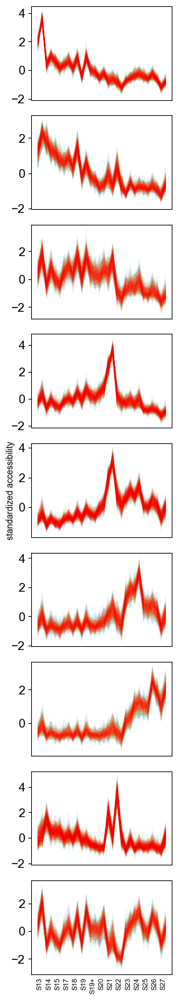

In [25]:
dummydf = multicov

acores = 9
sample = 1000

save_fig = True
fmt = 'pdf'

stage_labels = ['S13', 'S14', 'S15', 'S17', 'S18', 'S19', 'S19+', 'S20', 'S21', 'S22', 'S23', 'S24', 'S25', 'S26', 'S27']

plt.figure(figsize=(3, 16))
i = 1
for value in value_order:
    acore_num = value + 1
    acore_name = 'acore' + str(acore_num)
    plt.subplot(9, 1, i)
    
    stagedf = dummydf[dummydf['best_cluster'] == acore_num].sort_values('topval', axis = 0).tail(sample)
    vmin = stagedf['topval'].min()
    vmax = stagedf['topval'].max()
    
    for gene in stagedf.index:
        row = multicov.loc[gene].values
        row_values = row[0:-2]
        
        #get relative color of line compared to rest of dataset
        row_max = row[-1]
        relative_color = 1 - ((vmax - row_max) / (vmax - vmin))
        
        x = [i for i in np.arange(13, 28) for j in (0, 1)]
        
        plt.plot(row_values, alpha = 0.1, c = cm.rainbow(relative_color), linewidth = 0.5)
    plt.tight_layout()
    plt.yticks(fontsize = 14)
    plt.xticks([0.5 + (i * 2) for i in np.arange(0, 15)], stage_labels, rotation = 'vertical', fontsize = 8)
    if i == 5:
        plt.ylabel('standardized accessibility')
    if i < 9:
        plt.xticks([], [])
    plt.tick_params(axis='x', which='both', length=0)
    i += 1

if save_fig:
    plt.savefig('Mfuzz_' + str(acores) + 'acores_top' + str(sample) + 'peaks_profile_new.' + fmt)

<ipython-input-27-eed71312d9fa>:11: RuntimeWarning: overflow encountered in exp
  return (1/vecImpulseParam[3]) * (vecImpulseParam[2] + (vecImpulseParam[3] - vecImpulseParam[2]) * (1/(1 + np.exp(-vecImpulseParam[1] * (t - vecImpulseParam[5]))))) * (vecImpulseParam[4] + (vecImpulseParam[3] - vecImpulseParam[4]) * (1/(1 + np.exp(vecImpulseParam[1] * (t - vecImpulseParam[6])))))


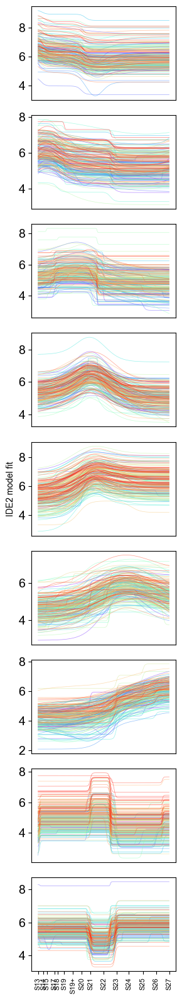

In [27]:
ImpulseParams_all = pd.DataFrame(pd.read_csv('OmniATAC-Seq_bothruns_ImpulseDE2_ImpulseParams_thpf.csv'))
dummydf = multicov

acores = 9
sample = 200

save_fig = True
fmt = 'pdf'

def ImpulseFunction(t, vecImpulseParam):
    return (1/vecImpulseParam[3]) * (vecImpulseParam[2] + (vecImpulseParam[3] - vecImpulseParam[2]) * (1/(1 + np.exp(-vecImpulseParam[1] * (t - vecImpulseParam[5]))))) * (vecImpulseParam[4] + (vecImpulseParam[3] - vecImpulseParam[4]) * (1/(1 + np.exp(vecImpulseParam[1] * (t - vecImpulseParam[6])))))

def ImpulseEvaluate(vecTimepoints, vecImpulseParam):
    vecImpulseValue = [ImpulseFunction(i, vecImpulseParam) for i in vecTimepoints]
    vecImpulseOutput = [i if i > 10^(-10) else 10^(-10) for i in vecImpulseValue] 
    return vecImpulseOutput

x_impulse_linspace = np.linspace(72, 192, 300)
x_impulse = [72, 77, 80, 87, 90, 96, 104, 112, 120, 132, 144, 155, 168, 180, 192]
x_impulse = [i for i in x_impulse for _ in (0, 1)]

plt.figure(figsize=(3, 16))
i = 1
for value in value_order:
    acore_num = value + 1
    acore_name = 'acore' + str(acore_num)
    plt.subplot(9, 1, i)
    
    stagedf = dummydf[dummydf['best_cluster'] == acore_num].sort_values('topval', axis = 0).tail(sample)
    vmin = stagedf['topval'].min()
    vmax = stagedf['topval'].max()

    vmin = stagedf['topval'].min()
    vmax = stagedf['topval'].max()
    
    for gene in stagedf.index:
        impulse_params_for_contig_all = ImpulseParams_all.loc[ImpulseParams_all['contig_start_end'] == gene].drop(columns = ['Unnamed: 0']).values.tolist()[0]
        row = multicov.loc[gene].values
        
        #get relative color of line compared to rest of dataset
        row_max = row[-1]
        relative_color = 1 - ((vmax - row_max) / (vmax - vmin))
        
        x = [i for i in np.arange(13, 28) for j in (0, 1)]
        impulse_fit_all = ImpulseEvaluate(x_impulse_linspace, impulse_params_for_contig_all)
        plt.plot(x_impulse_linspace, np.log(impulse_fit_all), alpha = 0.5, c = cm.rainbow(relative_color), linewidth = 0.5)
    
    plt.yticks(fontsize = 14)
    plt.xticks([72, 77, 80, 87, 90, 96, 104, 112, 120, 132, 144, 155, 168, 180, 192], ['S13', 'S14', 'S15', 'S17', 'S18', 'S19', 'S19+', 'S20', 'S21', 'S22', 'S23', 'S24', 'S25', 'S26', 'S27'], rotation = 'vertical', fontsize = 8)
    if i == 5:
        plt.ylabel('IDE2 model fit')
    if i < 9:
        plt.xticks([], [])
    
    plt.tight_layout()
    i += 1
    
if save_fig:
    plt.savefig('Mfuzz_' + str(acores) + 'acores_top' + str(sample) + 'model_fits_new.' + fmt)

# Convert clusters to peak and mRNA bed files

In [378]:
make_peak_bed = True
acores = 9

mfuzz_cmeans_export = mfuzz_cmeans
mfuzz_cmeans_export['contig'] = 'phaw_' + mfuzz_cmeans['gene.id'].str.split('_', expand = True)[1]
mfuzz_cmeans_export['start'] =  mfuzz_cmeans['gene.id'].str.split('_', expand = True)[2]
mfuzz_cmeans_export['end'] = mfuzz_cmeans['gene.id'].str.split('_', expand = True)[3]
mfuzz_cmeans_export['orientation'] = '+'
mfuzz_cmeans_export['score'] = '.'
mfuzz_cmeans_export = mfuzz_cmeans_export[['contig', 'start', 'end', 'gene.id', 'score', 'orientation', 'best_cluster']]
display(mfuzz_cmeans_export)

total = 0

if make_peak_bed:
    for i in np.arange(1, acores + 1):
        acore_prefix = 'Mfuzz_' + str(acores) + 'acores_acore' + str(i)
        acore_bed_name = acore_prefix + '_peaks.bed'
        acore_df = mfuzz_cmeans_export[mfuzz_cmeans_export['best_cluster'] == i].drop(columns = 'best_cluster')
        lines = len(acore_df)
        acore_df.to_csv(acore_bed_name, sep = '\t', header = False, index = False)
        total = total + lines
        print(total)

,contig,start,end,gene.id,score,orientation,best_cluster
0,phaw_50.000003,4302,5642,phaw_50.000003_4302_5642,.,+,6
1,phaw_50.000009,11628,11888,phaw_50.000009_11628_11888,.,+,4
2,phaw_50.000014,206406,207519,phaw_50.000014_206406_207519,.,+,6
3,phaw_50.000014,238984,239410,phaw_50.000014_238984_239410,.,+,5
4,phaw_50.000014,239711,240244,phaw_50.000014_239711_240244,.,+,4
...,...,...,...,...,...,...,...
181405,phaw_50.283875b,1496273,1496592,phaw_50.283875b_1496273_1496592,.,+,2
181406,phaw_50.283875b,1535466,1535680,phaw_50.283875b_1535466_1535680,.,+,2
181407,phaw_50.283875b,1546841,1547714,phaw_50.283875b_1546841_1547714,.,+,3
181408,phaw_50.283876,1905,3313,phaw_50.283876_1905_3313,.,+,6


8438
27031
44411
66025
82375
121933
140499
157702
181410


# Setup table for t-SNE

In [18]:
#Use this format to get the color orders correct, separating out the original clusters
#so that the two odd acores (1 and 4) are colored separately
###############
cluster_names = {5: 'Cluster 1',
                 8: 'Cluster 2',
                 4: 'Cluster 3',
                 7: 'Cluster 4',
                 2: 'Cluster 5',
                 6: 'Cluster 6',
                 1: 'Cluster 7',
                 0: 'Cluster 8',
                 3: 'Cluster 9'}
value_order = cluster_names.keys()
color_order = ['#ef3d4f', '#ecb18e', '#fccd35', '#75c043', '#5dcae8', '#6d6fb4', '#ca4699', '#789a97', '#b1914c']
colors = [None] * 9

j = 0
for i in value_order:
    colors[i] = color_order[j]
    j += 1
###############

acore_palette = dict(zip([i for i in np.arange(1, 10)], colors))
display(acore_palette)

stage_palette = {
    13 : '#e79ec0',
    14 : '#af3034',
    15 : '#e26e47',
    16 : '#f8cd47',
    17 : '#a3c754',
    18 : '#529650',
    19 : '#a1c9c9',
    20 : '#429798',
    21 : '#3f6695',
    22 : '#c49dc3',
    23 : '#603c90',
    24 : '#ccca73',
    25 : '#92683c',
    26 : '#999847',
    27 : '#603635'
}

stages = ['S13A', 'S13B', 'S14A', 'S14B', 'S15A', 'S15B', 'S17A', 'S17B', 'S18A', 'S18B', 'S19A', 'S19B', 'S19plusA', 'S19plusB', 'S20A', 'S20B', 'S21A', 'S21B', 'S22A', 'S22B', 'S23A', 'S23B', 'S24A', 'S24B', 'S25A', 'S25B', 'S26A', 'S26B', 'S27A', 'S27B']

IDE2_order = pd.DataFrame(pd.read_csv('OmniATAC-Seq_bothruns_ImpulseDE2_thpf.csv'))
IDE2_order.dropna(inplace = True)

acores = 9
mvalue = 1.1

hard_Mfuzz_dir = '/Users/dennis/Labwork/Bioinformatics/Omni-ATAC-Seq/Mfuzz_mikado/'
multicovloc = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/' + 'OmniATAC_bothruns_multicov_unformat_mikado.tsv'

name_generator_3 = hard_Mfuzz_dir + 'Mfuzz_a**_m*_*_clusters.tsv'.replace('**', str(acores)).replace('*_*', str(mvalue))

mfuzz_cmeans = pd.DataFrame(pd.read_csv(name_generator_3))
mfuzz_cmeans_val = mfuzz_cmeans.filter(regex=("cluster.*"))
mfuzz_cmeans['best_cluster'] = mfuzz_cmeans_val.idxmax(axis = 1).str.split('.', expand = True)[1].astype(int)
mfuzz_cmeans['topval'] = mfuzz_cmeans_val.max(axis = 1)

impulseDE2_sig = pd.DataFrame(pd.read_csv("~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/" + "OmniATAC-Seq_bothruns_ImpulseDE2_sigstable_max_thpf.tsv", sep = '\t'))

standardizedloc = '~/Labwork/Bioinformatics/Omni-ATAC-Seq/OmniATAC_bothruns_peaks/' + 'OmniATAC_bothruns_multicov_mfuzz_mikado_standardised.tsv'
multicov_standard = pd.DataFrame(pd.read_csv(standardizedloc, sep = '\t'))
multicov_standard.index = mfuzz_cmeans['gene.id']
multicov_standard['best_cluster'] = mfuzz_cmeans['best_cluster'].values
multicov_standard['topval'] = mfuzz_cmeans['topval'].values

multicov_merged = multicov_standard.merge(IDE2_order[['Gene', 'padj']], left_on = 'gene.id', right_on = 'Gene')
multicov_merged = multicov_merged.merge(impulseDE2_sig[['contig_start_end', 'stage_all']], left_on = 'Gene', right_on = 'contig_start_end')
display(IDE2_order)
display(multicov_standard)
display(multicov_merged)

{1: '#789a97',
 2: '#ca4699',
 3: '#5dcae8',
 4: '#b1914c',
 5: '#fccd35',
 6: '#ef3d4f',
 7: '#6d6fb4',
 8: '#75c043',
 9: '#ecb18e'}

,Unnamed: 0,Gene,p,padj,loglik_full,loglik_red,df_full,df_red,mean,converge_impulse,converge_const,converge_sigmoid,impulseTOsigmoid_p,impulseTOsigmoid_padj,sigmoidTOconst_p,sigmoidTOconst_padj,isTransient,isMonotonous,allZero
0,phaw_50.000003_4302_5642,phaw_50.000003_4302_5642,2.420988e-10,4.546495e-10,-144.979560,-171.827150,7.0,2.0,329.382888,0.0,0.0,0.0,1.935907e-05,6.759300e-05,5.257697e-07,9.652564e-07,True,False,False
1,phaw_50.000009_11628_11888,phaw_50.000009_11628_11888,5.035100e-01,5.068403e-01,-110.488293,-112.651242,7.0,2.0,39.295582,0.0,0.0,0.0,1.280275e-01,1.748866e-01,9.751527e-01,9.848212e-01,False,False,False
2,phaw_50.000014_206406_207519,phaw_50.000014_206406_207519,9.718023e-32,5.549791e-31,-148.922150,-226.594200,7.0,2.0,244.698997,0.0,0.0,0.0,3.864545e-01,4.632000e-01,4.765134e-33,3.350944e-32,False,True,False
3,phaw_50.000014_238984_239410,phaw_50.000014_238984_239410,4.480997e-11,8.825771e-11,-192.288622,-220.916001,7.0,2.0,42.281660,0.0,0.0,0.0,1.379100e-11,1.336731e-10,6.460761e-02,7.825643e-02,True,False,False
4,phaw_50.000014_239711_240244,phaw_50.000014_239711_240244,5.484058e-04,6.623235e-04,-174.097379,-185.044485,7.0,2.0,102.561481,0.0,0.0,0.0,8.908136e-03,1.663810e-02,5.983060e-03,8.021246e-03,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190072,phaw_50.283875b_1496273_1496592,phaw_50.283875b_1496273_1496592,1.755583e-13,4.028948e-13,-113.340048,-147.778147,7.0,2.0,39.093870,0.0,0.0,0.0,2.481813e-03,5.360276e-03,2.727801e-12,7.019454e-12,False,True,False
190073,phaw_50.283875b_1535466_1535680,phaw_50.283875b_1535466_1535680,2.125769e-05,2.837894e-05,-139.679935,-154.276092,7.0,2.0,38.973560,0.0,0.0,0.0,1.000000e+00,1.000000e+00,1.189665e-15,3.690775e-15,False,True,False
190074,phaw_50.283875b_1546841_1547714,phaw_50.283875b_1546841_1547714,2.954523e-34,1.868503e-33,-155.292357,-238.868765,7.0,2.0,280.071281,0.0,0.0,0.0,1.162125e-05,4.244864e-05,4.194840e-31,2.720916e-30,True,False,False
190076,phaw_50.283876_1905_3313,phaw_50.283876_1905_3313,5.477985e-42,4.588849e-41,-165.692614,-267.363090,7.0,2.0,526.370022,0.0,0.0,0.0,3.435391e-02,5.486718e-02,2.290973e-42,2.298576e-41,False,True,False


,S13A,S13B,S14A,S14B,S15A,S15B,S17A,S17B,S18A,S18B,...,S24A,S24B,S25A,S25B,S26A,S26B,S27A,S27B,best_cluster,topval
gene.id,,,,,,,,,,,,,,,,,,,,,
phaw_50.000003_4302_5642,1.280766,3.321805,0.276840,1.148015,1.264172,0.011339,0.202168,0.426184,0.011339,1.181203,...,0.094308,0.152387,-0.046739,-0.801758,0.069417,-0.610929,-1.365947,-0.801758,6,0.999955
phaw_50.000009_11628_11888,-0.184115,1.024140,-1.219763,2.146092,0.074797,0.678925,0.161101,1.455660,0.333709,0.074797,...,-0.960851,0.937836,-0.443027,-0.443027,1.973484,0.765229,-1.392371,-0.443027,4,0.327226
phaw_50.000014_206406_207519,2.033280,3.462084,0.337477,0.972501,0.878691,0.149856,0.582827,0.828177,0.395206,0.907555,...,-0.571762,-0.636708,-0.600627,-0.506817,-0.521249,-0.788248,-1.091327,-0.845977,6,0.999960
phaw_50.000014_238984_239410,1.426282,1.793443,0.578986,1.369795,-0.353040,-0.720202,-0.127094,-0.240067,0.466013,0.776688,...,-0.833174,-1.059120,-0.833174,-1.087363,-1.030877,-1.059120,0.889661,1.426282,5,0.565966
phaw_50.000014_239711_240244,0.936963,1.176528,-0.979552,-0.300786,0.996854,-0.001331,0.278161,0.397943,-0.240895,0.158379,...,0.018633,1.076709,0.437871,1.276346,-1.558500,-1.298972,-1.398790,-0.440532,4,0.440959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
phaw_50.283875b_1496273_1496592,1.733407,-0.311124,-0.266678,-0.133339,0.355571,-0.444463,0.222232,-1.155605,-0.711141,-0.177785,...,0.622249,1.155605,1.066712,1.244497,1.644514,1.422283,0.488910,2.266763,2,0.999628
phaw_50.283875b_1535466_1535680,-0.537560,0.172177,-1.050148,-1.010718,-0.576990,-0.419271,-0.419271,-1.129008,-0.182692,-0.143262,...,1.867660,1.591651,0.527046,1.867660,2.104239,1.355072,0.132747,1.749371,2,0.999843
phaw_50.283875b_1546841_1547714,-1.056819,-0.166099,-1.409745,-0.283742,-0.829937,-1.073625,-0.603056,-0.603056,-0.989594,-0.124084,...,0.716217,2.052295,-0.115681,0.060782,0.144812,-0.040054,-0.678683,-0.308951,3,0.999998


,S13A,S13B,S14A,S14B,S15A,S15B,S17A,S17B,S18A,S18B,...,S26A,S26B,S27A,S27B,best_cluster,topval,Gene,padj,contig_start_end,stage_all
0,1.280766,3.321805,0.276840,1.148015,1.264172,0.011339,0.202168,0.426184,0.011339,1.181203,...,0.069417,-0.610929,-1.365947,-0.801758,6,0.999955,phaw_50.000003_4302_5642,4.546495e-10,phaw_50.000003_4302_5642,13
1,2.033280,3.462084,0.337477,0.972501,0.878691,0.149856,0.582827,0.828177,0.395206,0.907555,...,-0.521249,-0.788248,-1.091327,-0.845977,6,0.999960,phaw_50.000014_206406_207519,5.549791e-31,phaw_50.000014_206406_207519,13
2,1.426282,1.793443,0.578986,1.369795,-0.353040,-0.720202,-0.127094,-0.240067,0.466013,0.776688,...,-1.030877,-1.059120,0.889661,1.426282,5,0.565966,phaw_50.000014_238984_239410,8.825771e-11,phaw_50.000014_238984_239410,27
3,0.936963,1.176528,-0.979552,-0.300786,0.996854,-0.001331,0.278161,0.397943,-0.240895,0.158379,...,-1.558500,-1.298972,-1.398790,-0.440532,4,0.440959,phaw_50.000014_239711_240244,6.623235e-04,phaw_50.000014_239711_240244,18
4,1.062525,3.488467,0.216266,0.752230,0.216266,-0.263281,1.654906,0.977899,-0.263281,-0.263281,...,-0.968496,-0.968496,-0.996705,-1.053122,6,0.862725,phaw_50.000019_87818_88035,2.897293e-38,phaw_50.000019_87818_88035,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163222,1.733407,-0.311124,-0.266678,-0.133339,0.355571,-0.444463,0.222232,-1.155605,-0.711141,-0.177785,...,1.644514,1.422283,0.488910,2.266763,2,0.999628,phaw_50.283875b_1496273_1496592,4.028948e-13,phaw_50.283875b_1496273_1496592,27
163223,-0.537560,0.172177,-1.050148,-1.010718,-0.576990,-0.419271,-0.419271,-1.129008,-0.182692,-0.143262,...,2.104239,1.355072,0.132747,1.749371,2,0.999843,phaw_50.283875b_1535466_1535680,2.837894e-05,phaw_50.283875b_1535466_1535680,27
163224,-1.056819,-0.166099,-1.409745,-0.283742,-0.829937,-1.073625,-0.603056,-0.603056,-0.989594,-0.124084,...,0.144812,-0.040054,-0.678683,-0.308951,3,0.999998,phaw_50.283875b_1546841_1547714,1.868503e-33,phaw_50.283875b_1546841_1547714,22
163225,1.809053,3.320787,0.932177,0.862027,0.984790,0.472695,0.721727,1.061955,0.079854,0.862027,...,-0.523436,-0.618139,-1.221430,-0.569034,6,0.999896,phaw_50.283876_1905_3313,4.588849e-41,phaw_50.283876_1905_3313,13


# Run t-SNE on top_n clusters

In [123]:
top_n = 25000
perplexity = 50
acores = 9

multicov_sorted = multicov_merged.sort_values(axis = 0, by = 'padj', ascending = True)
display(multicov_sorted)

multicov_top_n = multicov_sorted.head(top_n).loc[:, stages].values

tsne = TSNE(n_components=2, verbose=1, perplexity=perplexity, n_iter=300)
tsne_results = tsne.fit_transform(multicov_top_n)

,S13A,S13B,S14A,S14B,S15A,S15B,S17A,S17B,S18A,S18B,...,S26A,S26B,S27A,S27B,best_cluster,topval,Gene,padj,contig_start_end,stage_all
134936,-0.697526,-0.598387,-0.767291,-0.704870,-0.745260,-0.772187,-0.722005,-0.702422,-0.653464,-0.400108,...,-0.086778,-0.253234,-0.506591,-0.277713,3,0.999832,phaw_50.283862a_3596104_3596889,0.000000,phaw_50.283862a_3596104_3596889,22
111448,-0.936921,-0.757914,-1.045157,-0.828164,-0.984274,-1.018098,-0.901536,-0.814634,-0.755313,-0.519586,...,0.307277,0.230262,-0.370241,0.108497,3,0.999999,phaw_50.283817f_2299012_2301003,0.000000,phaw_50.283817f_2299012_2301003,22
147978,-0.702309,-0.651071,-0.645947,-0.681814,-0.702309,-0.779167,-0.661318,-0.712557,-0.640823,-0.522974,...,2.418116,1.526566,1.116658,2.438612,2,0.999999,phaw_50.283868b_10417964_10419045,0.000000,phaw_50.283868b_10417964_10419045,27
28989,-0.901448,-0.881347,-0.928251,-0.898577,-0.932080,-0.900491,-0.842101,-0.865074,-0.866988,-0.804769,...,0.647338,0.520027,-0.222778,0.358257,3,0.999988,phaw_50.007301c_14994990_14995881,0.000000,phaw_50.007301c_14994990_14995881,22
150493,-0.948523,-0.800748,-0.977630,-0.941806,-1.000021,-0.991064,-0.991064,-0.923894,-1.044801,-0.814182,...,1.469617,1.158394,0.670288,1.438271,3,0.919293,phaw_50.283869b_6145234_6147429,0.000000,phaw_50.283869b_6145234_6147429,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56650,-0.478369,0.381868,1.622594,0.274338,0.646556,0.936059,0.092365,0.208166,-0.172323,-0.089608,...,-0.635527,-0.834044,-0.883673,0.406682,1,1.000000,phaw_50.143217_8_373,0.009988,phaw_50.143217_8_373,27
113145,0.608862,3.035322,0.440358,-0.671770,0.608862,-0.267360,0.204452,0.271853,1.687289,0.844768,...,-0.840274,-1.278385,-1.649094,-0.671770,5,0.937467,phaw_50.283821_10895487_10896151,0.009988,phaw_50.283821_10895487_10896151,13
44854,1.700658,3.082890,0.472007,1.024900,0.748453,-0.050170,-0.510914,1.424211,-0.756644,0.472007,...,-0.173035,-0.449481,-1.217388,-0.142319,6,0.998400,phaw_50.049043_197_643,0.009993,phaw_50.049043_197_643,13
31897,1.544527,3.653696,-0.169173,0.687677,0.292208,-1.091934,-0.037350,0.292208,-0.828288,0.292208,...,0.489942,-0.300996,0.028562,0.424031,6,0.908012,phaw_50.014740_778_1179,0.009994,phaw_50.014740_778_1179,25


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 25000 samples in 0.000s...
[t-SNE] Computed neighbors for 25000 samples in 17.317s...
[t-SNE] Computed conditional probabilities for sample 1000 / 25000
[t-SNE] Computed conditional probabilities for sample 2000 / 25000
[t-SNE] Computed conditional probabilities for sample 3000 / 25000
[t-SNE] Computed conditional probabilities for sample 4000 / 25000
[t-SNE] Computed conditional probabilities for sample 5000 / 25000
[t-SNE] Computed conditional probabilities for sample 6000 / 25000
[t-SNE] Computed conditional probabilities for sample 7000 / 25000
[t-SNE] Computed conditional probabilities for sample 8000 / 25000
[t-SNE] Computed conditional probabilities for sample 9000 / 25000
[t-SNE] Computed conditional probabilities for sample 10000 / 25000
[t-SNE] Computed conditional probabilities for sample 11000 / 25000
[t-SNE] Computed conditional probabilities for sample 12000 / 25000
[t-SNE] Computed conditional probabilities for s

<ipython-input-132-ff528fdef717>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ImpulseDE2_sorted_top_n['tsne-2d-one'] = tsne_results[:,0]
<ipython-input-132-ff528fdef717>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ImpulseDE2_sorted_top_n['tsne-2d-two'] = tsne_results[:,1]


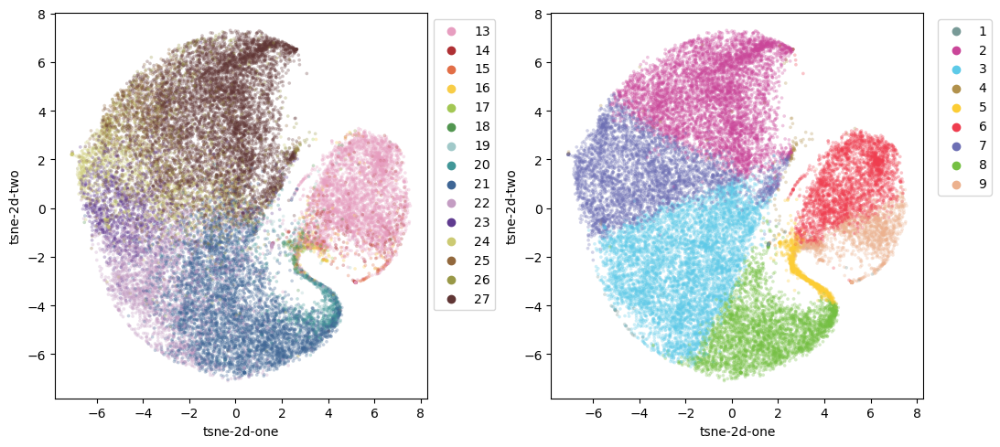

In [132]:
ImpulseDE2_sorted_top_n = multicov_sorted.head(top_n)
ImpulseDE2_sorted_top_n['tsne-2d-one'] = tsne_results[:,0]
ImpulseDE2_sorted_top_n['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(11, 5))
plt.subplot(1, 2, 1)
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="stage_all",
    palette=stage_palette,
    data=ImpulseDE2_sorted_top_n,
    legend = 'full',
    alpha=0.3,
    linewidth = 0,
    s=7
)
plt.legend(loc='upper right', bbox_to_anchor = (1.2, 1))
plt.subplot(1, 2, 2)
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="best_cluster",
    palette=acore_palette,
    data=ImpulseDE2_sorted_top_n,
    legend = True,
    alpha=0.3,
    linewidth = 0,
    s=7
)
plt.legend(loc='upper right', bbox_to_anchor = (1.2, 1))
plt.tight_layout()

plt.savefig('ImpulseDE2_Mfuzz_top' + str(top_n) + '_p' + str(perplexity) + '_c' + str(acores) + '_tsne_multiplot.pdf')

<ipython-input-134-87b925088a03>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ImpulseDE2_sorted_top_n['tsne-2d-one'] = tsne_results[:,0]
<ipython-input-134-87b925088a03>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ImpulseDE2_sorted_top_n['tsne-2d-two'] = tsne_results[:,1]
<ipython-input-134-87b925088a03>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

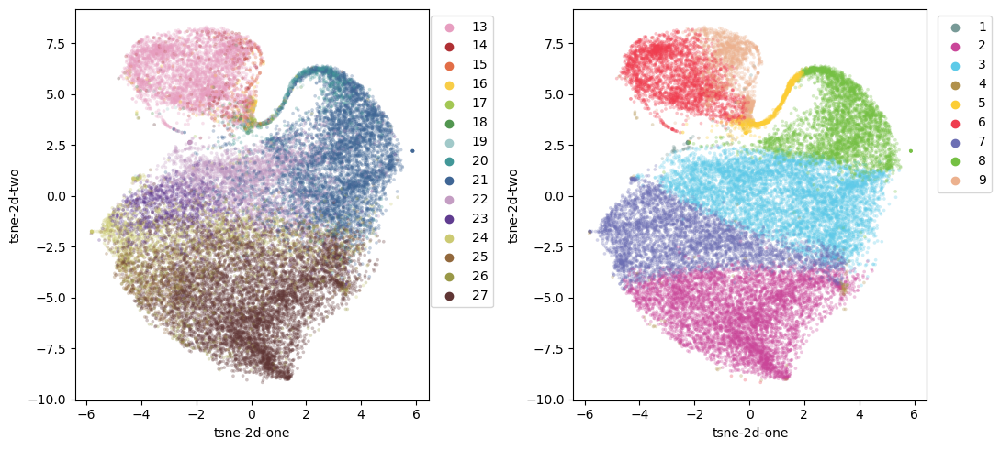

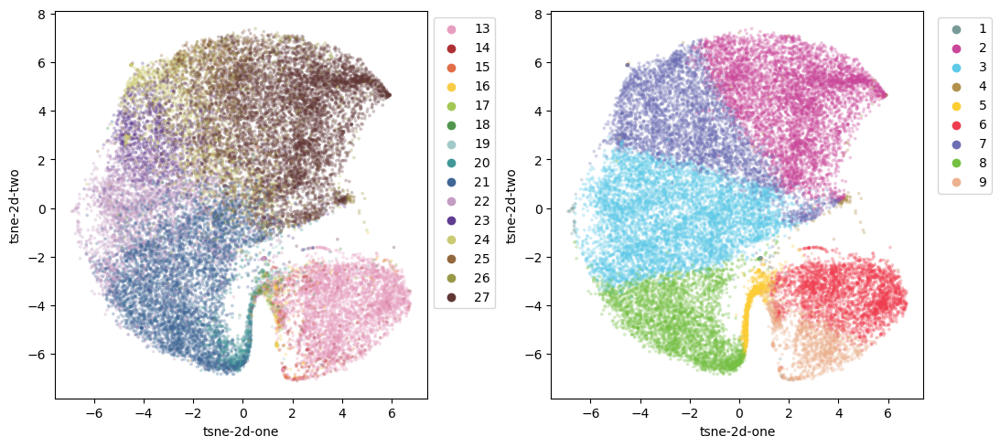

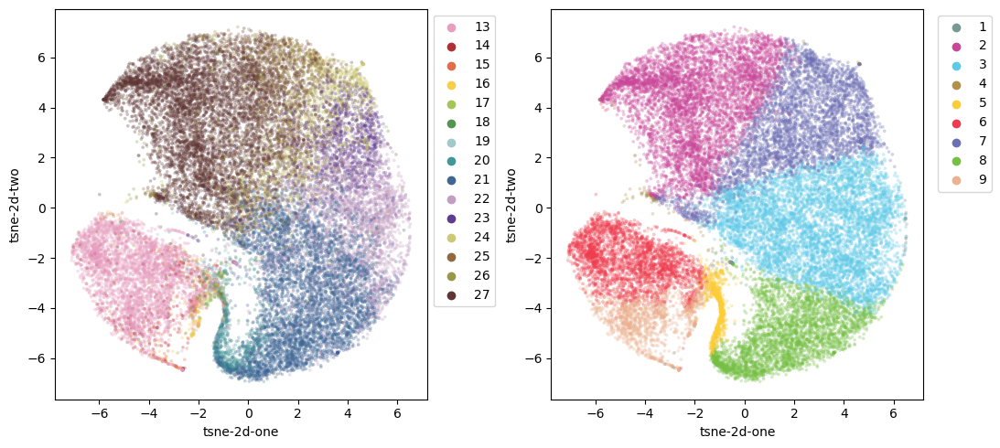

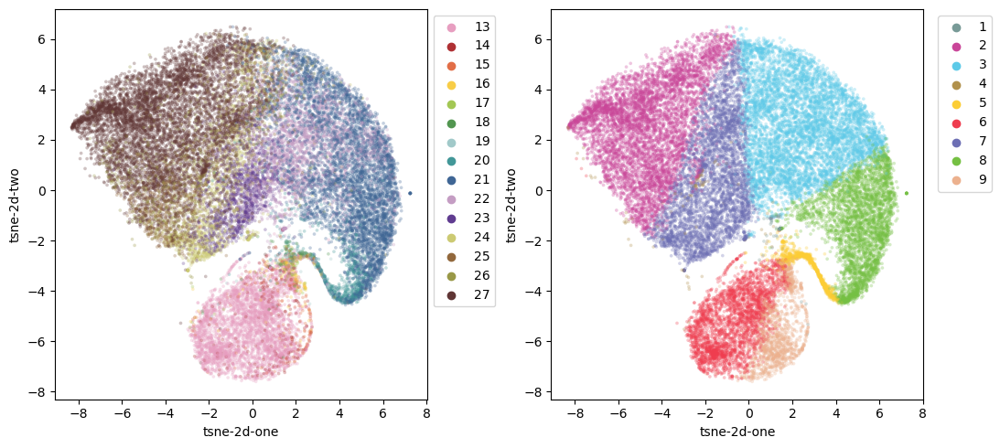

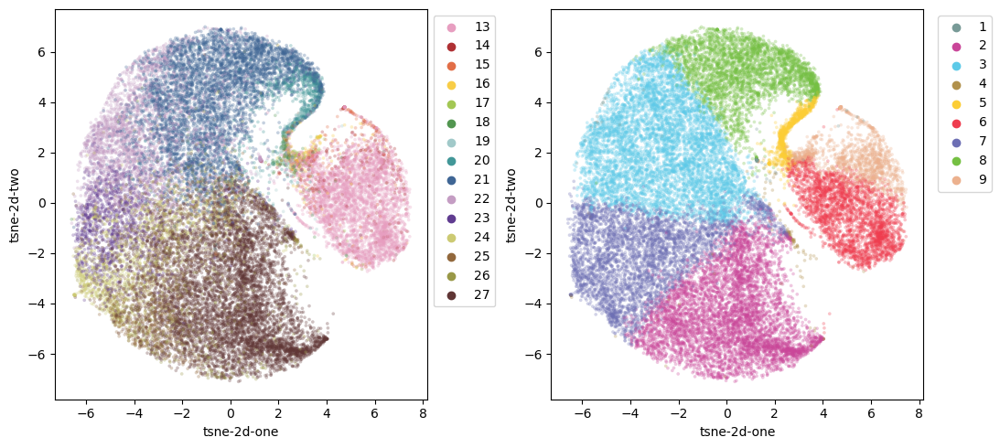

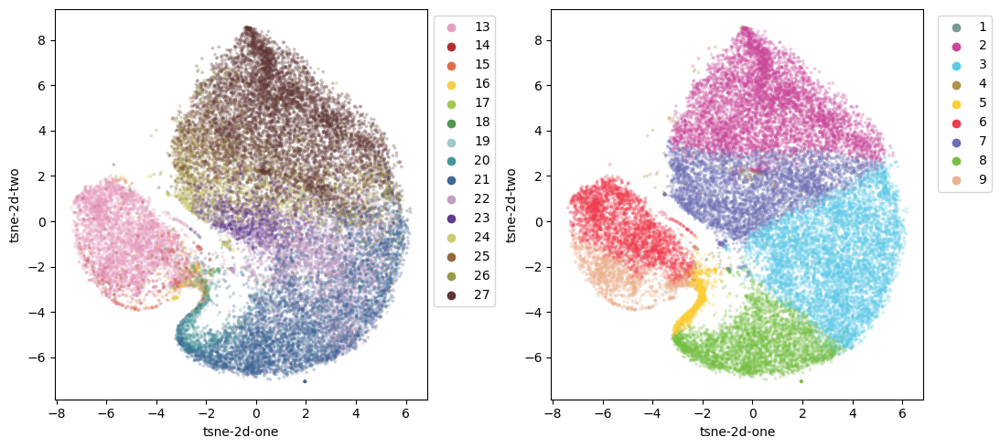

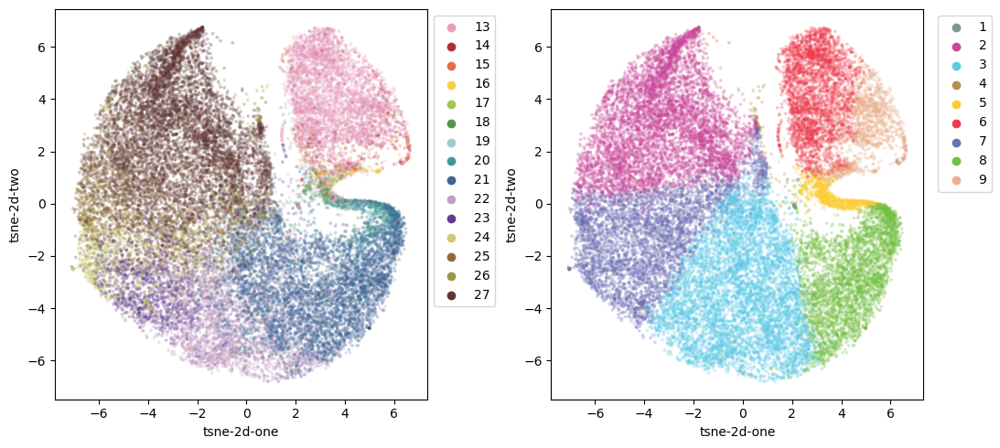

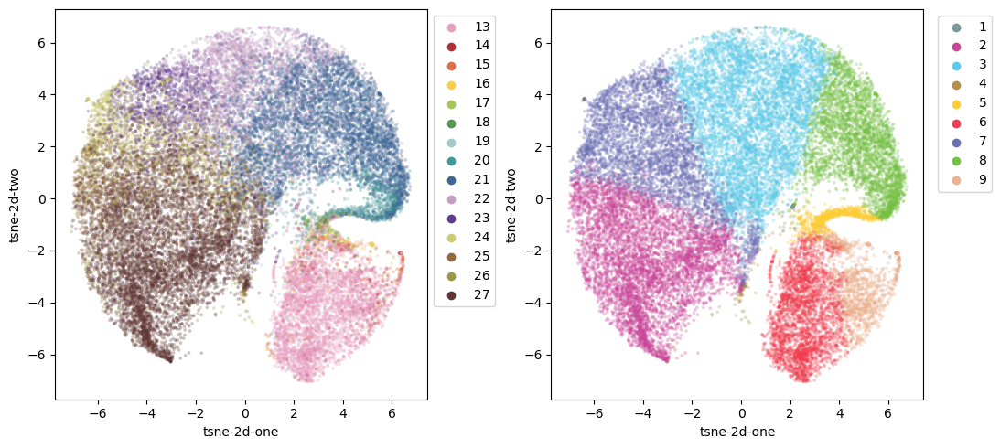

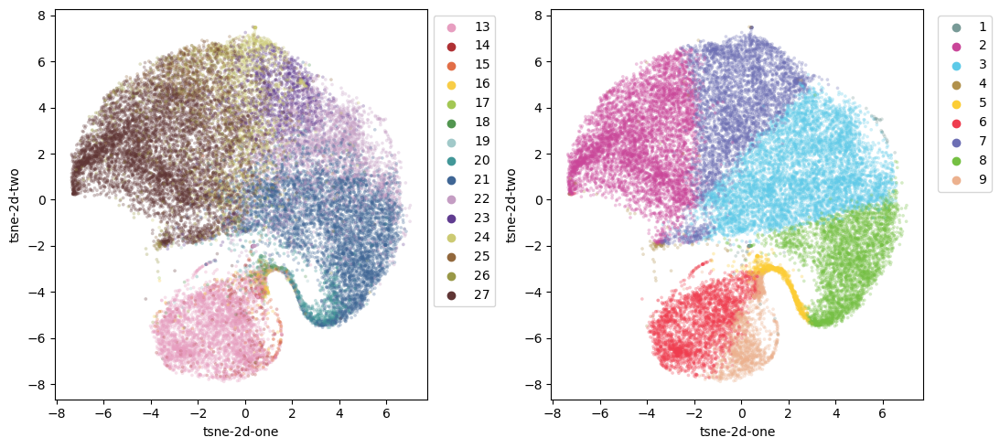

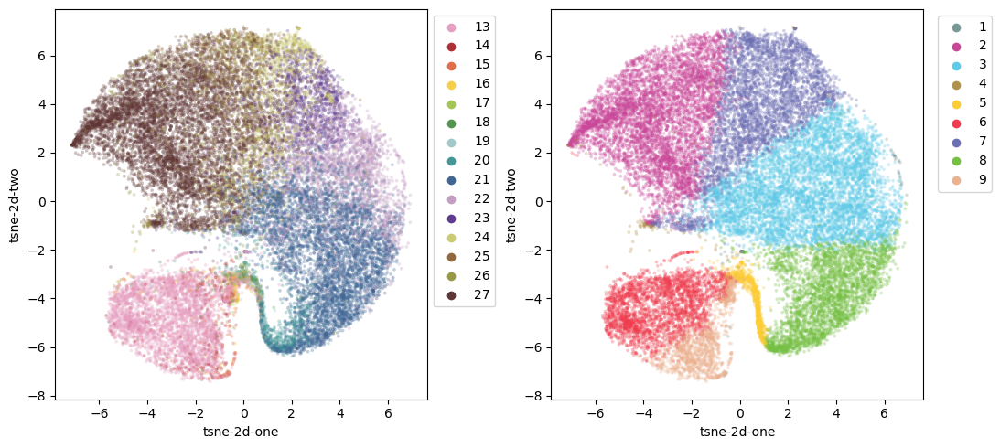

In [134]:
#Perform tSNE and plot repeatedly until you get a plot that looks nice for the figure

top_n = 25000
perplexity = 50
acores = 9

plot_iterations = 10

multicov_sorted = multicov_merged.sort_values(axis = 0, by = 'padj', ascending = True)
multicov_top_n = multicov_sorted.head(top_n).loc[:, stages].values

for k in np.arange(plot_iterations):
    tsne = TSNE(n_components=2, verbose=0, perplexity=perplexity, n_iter=300)
    tsne_results = tsne.fit_transform(multicov_top_n)

    ImpulseDE2_sorted_top_n = multicov_sorted.head(top_n)
    ImpulseDE2_sorted_top_n['tsne-2d-one'] = tsne_results[:,0]
    ImpulseDE2_sorted_top_n['tsne-2d-two'] = tsne_results[:,1]

    plt.figure(figsize=(11, 5))
    plt.subplot(1, 2, 1)
    sns.scatterplot(
        x="tsne-2d-one", y="tsne-2d-two",
        hue="stage_all",
        palette=stage_palette,
        data=ImpulseDE2_sorted_top_n,
        legend = 'full',
        alpha=0.3,
        linewidth = 0,
        s=7
    )
    plt.legend(loc='upper right', bbox_to_anchor = (1.2, 1))
    plt.subplot(1, 2, 2)
    sns.scatterplot(
        x="tsne-2d-one", y="tsne-2d-two",
        hue="best_cluster",
        palette=acore_palette,
        data=ImpulseDE2_sorted_top_n,
        legend = True,
        alpha=0.3,
        linewidth = 0,
        s=7
    )
    plt.legend(loc='upper right', bbox_to_anchor = (1.2, 1))
    plt.tight_layout()

    plt.savefig('ImpulseDE2_Mfuzz_top' + str(top_n) + '_p' + str(perplexity) + '_c' + str(acores) + '_tsne_multiplot_iter' + str(k) + '.pdf')

In [22]:
acores = 9

name_generator4 = [str(i).join(name_generator.split('!!!')) for i in np.arange(1, acores +1)]
peak_classes = pd.DataFrame(pd.read_csv("~/Labwork/Bioinformatics/Transcripts/" + "Sall_peaktypes.gff", sep = '\t', header = None))
peak_classes['newstart'] = peak_classes[3] - 1
peak_classes[2] = peak_classes[0].astype('str') + '_' + peak_classes['newstart'].astype('str') + '_' + peak_classes[4].astype('str')

results_dummy = {}

counts = dict(peak_classes[1].value_counts())
reordered_counts = {}

category_names = ['unknown', 'distal_intergenic', 'proximal_intergenic', 'promoter', 'exon', 'gene', 'ncRNA_gene']
    
for peaktype in category_names:
    if peaktype in list(counts.keys()):
        reordered_counts[peaktype] = counts[peaktype]
    else:
        reordered_counts[peaktype] = 0

results_dummy['all peaks'] = [i for i in list(reordered_counts.values())]
display(results_dummy)

stage_dict = {}
groups_dict = {}

results_original = {}

category_names = ['unknown', 'distal_intergenic', 'proximal_intergenic', 'promoter', 'exon', 'gene', 'ncRNA_gene']
cluster_names = {5: 'Cluster 1',
                 8: 'Cluster 2',
                 4: 'Cluster 3',
                 7: 'Cluster 4',
                 2: 'Cluster 5',
                 6: 'Cluster 6',
                 1: 'Cluster 7',
                 0: 'Cluster 8',
                 3: 'Cluster 9'}

for file in name_generator4:
    group_num = file.split('_')[-1].split('.')[0]
    group_int = str(group_num.replace('acore', ''))
    groups_dict[group_num] = pd.read_csv(file, skiprows = 3, header = None, sep = ' ')
    groups_dict[group_num] = groups_dict[group_num].merge(peak_classes, left_on = 0, right_on = 2)
    
    counts = dict(groups_dict[group_num]['1_y'].value_counts())
    
    reordered_counts = {}
    
    for peaktype in category_names:
        if peaktype in list(counts.keys()):
            reordered_counts[peaktype] = counts[peaktype]
        else:
            reordered_counts[peaktype] = 0
    
    results_original[group_int] = [i for i in list(reordered_counts.values())]

results_temp = {cluster_names[int(i) - 1]: results_original[i] for i in results_original}
cluster_name_generator = ['Cluster ' + str(i) for i in np.arange(1, 10)]
results_converted1 = {cluster_name: results_temp[cluster_name] for cluster_name in cluster_name_generator}

results_converted = {**results_dummy, **results_converted1}

display(results_converted)

{'all peaks': [34571, 97335, 38243, 17863, 1032, 1021, 13]}

{'all peaks': [34571, 97335, 38243, 17863, 1032, 1021, 13],
 'Cluster 1': [9982, 15812, 8037, 4042, 479, 315, 4],
 'Cluster 2': [9337, 7014, 3986, 2161, 348, 251, 4],
 'Cluster 3': [1448, 8305, 3952, 1326, 42, 58, 0],
 'Cluster 4': [1214, 11056, 3423, 929, 17, 47, 0],
 'Cluster 5': [904, 11422, 3143, 1306, 7, 42, 0],
 'Cluster 6': [905, 11549, 3677, 1645, 16, 53, 0],
 'Cluster 7': [652, 12178, 3541, 1713, 5, 70, 0],
 'Cluster 8': [4622, 2102, 890, 293, 22, 40, 1],
 'Cluster 9': [2314, 9851, 4572, 3140, 60, 72, 0]}

{'all peaks': [0.182, 0.512, 0.201, 0.094, 0.005, 0.005, 0.0],
 'Cluster 1': [0.258, 0.409, 0.208, 0.105, 0.012, 0.008, 0.0],
 'Cluster 2': [0.404, 0.304, 0.173, 0.094, 0.015, 0.011, 0.0],
 'Cluster 3': [0.096, 0.549, 0.261, 0.088, 0.003, 0.004, 0.0],
 'Cluster 4': [0.073, 0.663, 0.205, 0.056, 0.001, 0.003, 0.0],
 'Cluster 5': [0.054, 0.679, 0.187, 0.078, 0.0, 0.002, 0.0],
 'Cluster 6': [0.051, 0.647, 0.206, 0.092, 0.001, 0.003, 0.0],
 'Cluster 7': [0.036, 0.671, 0.195, 0.094, 0.0, 0.004, 0.0],
 'Cluster 8': [0.58, 0.264, 0.112, 0.037, 0.003, 0.005, 0.0],
 'Cluster 9': [0.116, 0.492, 0.228, 0.157, 0.003, 0.004, 0.0]}

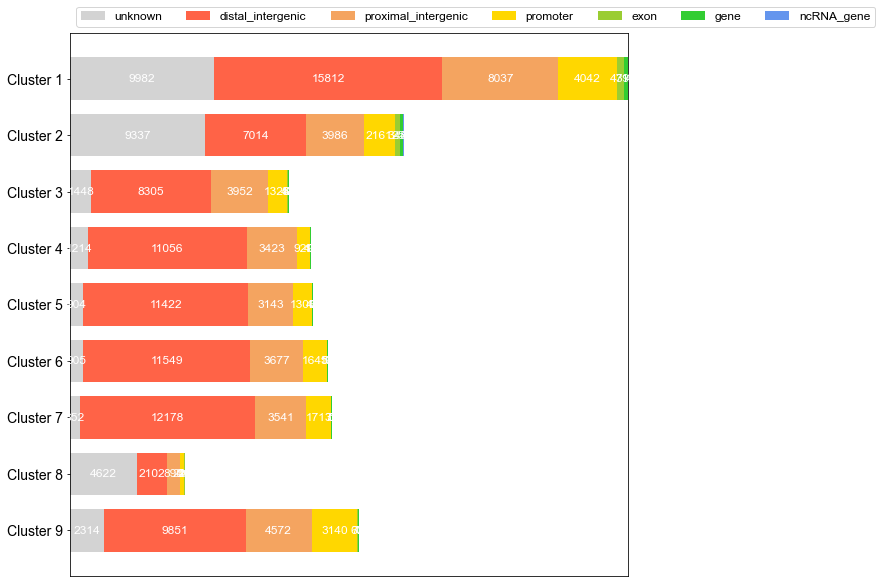

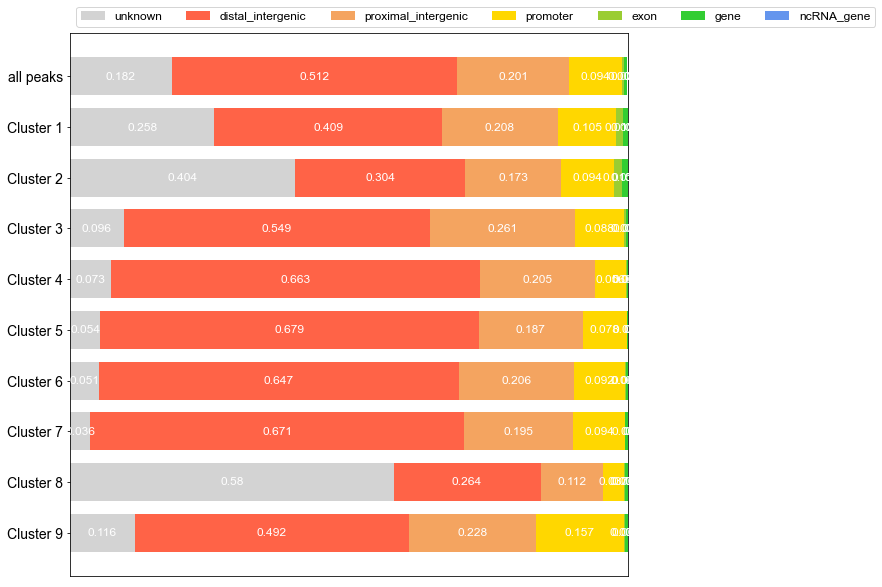

In [23]:
results_fraction = {}
for i in results_converted:
    results_fraction[i] = [np.round(j / sum(results_converted[i]), 3) for j in results_converted[i]]

display(results_fraction)

def survey(results, category_names):
    """
    Parameters
    ----------
    results : dict
        A mapping from question labels to a list of answers per category.
        It is assumed all lists contain the same number of entries and that
        it matches the length of *category_names*.
    category_names : list of str
        The category labels.
    """
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = ['lightgray', 'tomato', 'sandybrown', 'gold', 'yellowgreen', 'limegreen', 'cornflowerblue', 'mediumslateblue']

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    for i, (colname, color) in enumerate(zip(category_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        rects = ax.barh(labels, widths, left=starts, height=0.75,
                        label=colname, color=color)

        text_color = 'white'
        ax.bar_label(rects, label_type='center', color=text_color, fontsize = 12)
    ax.legend(ncol=len(category_names), bbox_to_anchor=(0, 1),
              loc='lower left', fontsize= 12)
    plt.yticks(fontsize = 14)

    return fig, ax

survey({i: results_converted[i] for i in results_converted if 'Cluster' in i}, category_names)
plt.show()

survey(results_fraction, category_names)
plt.savefig('Mfuzz_peaktypes.svg')
plt.show()

# Plot representation of peaks in top_n t-SNE

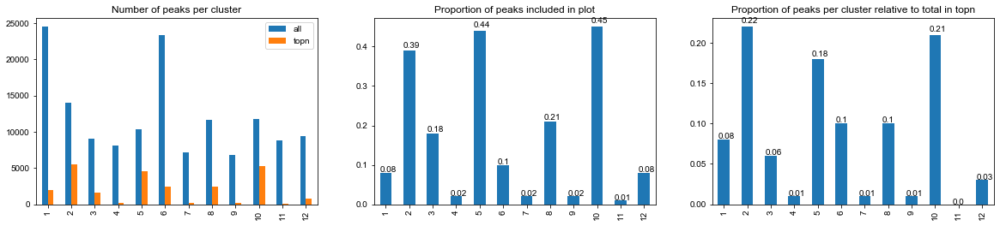

In [279]:
multicov_acores_hist = list(ImpulseDE2_sorted['best_cluster'])
multicov_value_counts = ImpulseDE2_sorted['best_cluster'].value_counts()

multicov_top_n_acores_hist = list(ImpulseDE2_sorted.head(top_n)['best_cluster'])
multicov_top_n_value_counts = ImpulseDE2_sorted.head(top_n)['best_cluster'].value_counts()

fig = plt.figure(figsize=(20, 4))

ax1 = fig.add_subplot(131)
ax1.set_title('Number of peaks per cluster')
multicov_barh = pd.DataFrame({'all': multicov_value_counts, 'topn': multicov_top_n_value_counts})
multicov_barh.plot.bar(ax = ax1)

ax2 = fig.add_subplot(132)
ax2.set_title('Proportion of peaks included in plot')
multicov_proportion_barh = multicov_barh.apply(lambda x: round(x['topn'] / x['all'], 2), axis = 1)
multicov_proportion_barh.plot.bar(ax = ax2)
for p in ax2.patches:
    ax2.annotate(str(p.get_height()), (p.get_x() * 1, p.get_height() * 1.02))
    
ax3 = fig.add_subplot(133)
ax3.set_title('Proportion of peaks per cluster relative to total in topn')
multicov_proportion_barh = multicov_barh.apply(lambda x: round(x['topn'] / sum(multicov_barh['topn']), 2), axis = 1)
multicov_proportion_barh.plot.bar(ax = ax3)
for p in ax3.patches:
    ax3.annotate(str(p.get_height()), (p.get_x() * 1, p.get_height() * 1.02))

fig.savefig(Mfuzz_folder_loc + 'ImpulseDE2_Mfuzz_top' + str(top_n) + '_p' + str(perplexity) + '_c' + str(acores) + '_tsne_representation_hists_' + suffix + '.pdf')

# Run t-SNE on a random sample of rand_n peaks

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 25000 samples in 0.027s...
[t-SNE] Computed neighbors for 25000 samples in 44.574s...
[t-SNE] Computed conditional probabilities for sample 1000 / 25000
[t-SNE] Computed conditional probabilities for sample 2000 / 25000
[t-SNE] Computed conditional probabilities for sample 3000 / 25000
[t-SNE] Computed conditional probabilities for sample 4000 / 25000
[t-SNE] Computed conditional probabilities for sample 5000 / 25000
[t-SNE] Computed conditional probabilities for sample 6000 / 25000
[t-SNE] Computed conditional probabilities for sample 7000 / 25000
[t-SNE] Computed conditional probabilities for sample 8000 / 25000
[t-SNE] Computed conditional probabilities for sample 9000 / 25000
[t-SNE] Computed conditional probabilities for sample 10000 / 25000
[t-SNE] Computed conditional probabilities for sample 11000 / 25000
[t-SNE] Computed conditional probabilities for sample 12000 / 25000
[t-SNE] Computed conditional probabilities for s

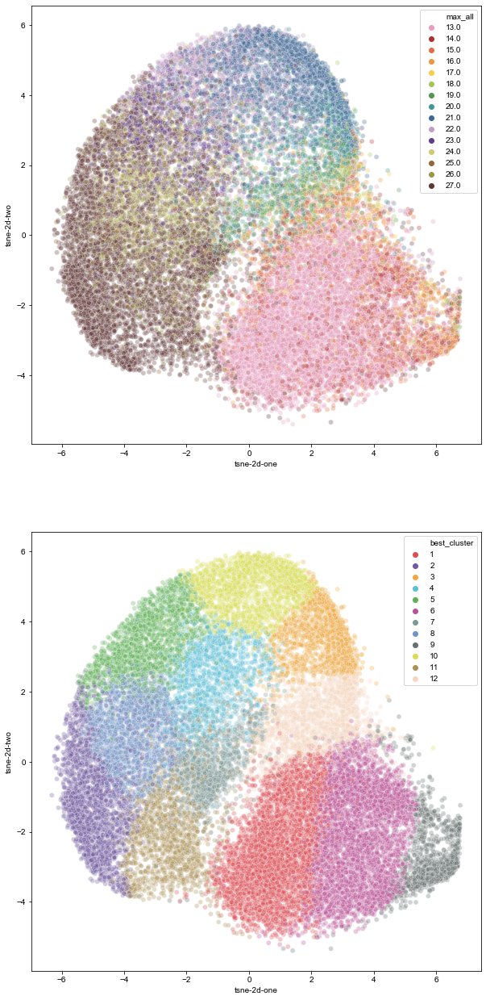

In [280]:
rand_n = 25000
perplexity = 100

multicov_rand_n = ImpulseDE2_sorted.sample(rand_n, axis = 'rows', random_state = 83193)
multicov_rand_n_matrix = multicov_rand_n.loc[:, stages].values

tsne = TSNE(n_components=2, verbose=1, perplexity=perplexity, n_iter=300)
tsne_results = tsne.fit_transform(multicov_rand_n_matrix)

multicov_rand_n['tsne-2d-one'] = tsne_results[:,0]
multicov_rand_n['tsne-2d-two'] = tsne_results[:,1]

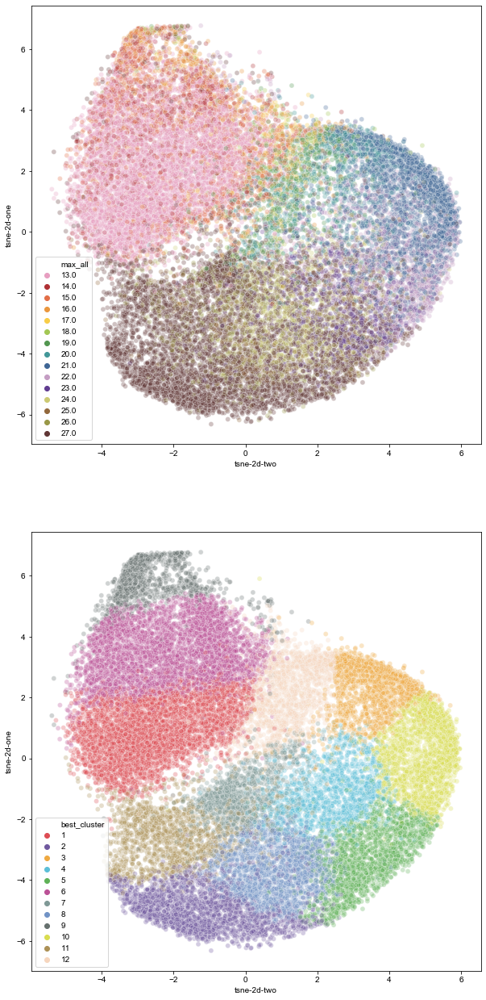

In [282]:
plt.figure(figsize=(10,22))
plt.subplot(2, 1, 1)
sns.scatterplot(
    x="tsne-2d-two", y="tsne-2d-one",
    hue="max_all",
    palette=stage_palette,
    data=multicov_rand_n,
    alpha=0.3
)
plt.subplot(2, 1, 2)
sns.scatterplot(
    x="tsne-2d-two", y="tsne-2d-one",
    hue="best_cluster",
    palette=acore_palette,
    data=multicov_rand_n,
    legend = 'full',
    alpha=0.3
)
plt.savefig(Mfuzz_folder_loc + 'ImpulseDE2_Mfuzz_rand' + str(rand_n) + '_p' + str(perplexity) + '_c' + str(acores) + '_tsne_multiplot_' + suffix + '.pdf')

# Plot representation of peaks in rand_n t-SNE

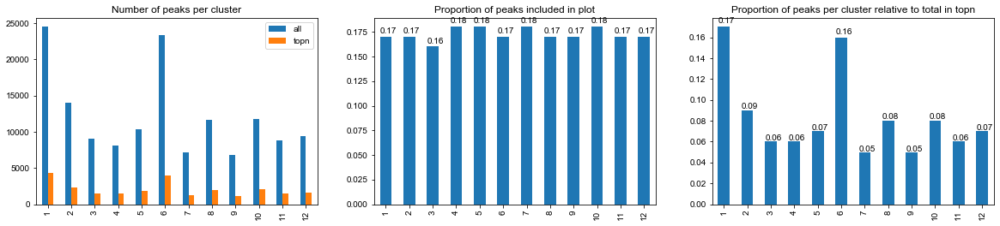

In [281]:
multicov_acores_hist = list(ImpulseDE2_sorted['best_cluster'])
multicov_value_counts = ImpulseDE2_sorted['best_cluster'].value_counts()

multicov_rand_n_acores_hist = list(multicov_rand_n['best_cluster'])
multicov_rand_n_value_counts = multicov_rand_n['best_cluster'].value_counts()

fig = plt.figure(figsize=(20, 4))

ax1 = fig.add_subplot(131)
ax1.set_title('Number of peaks per cluster')
multicov_barh = pd.DataFrame({'all': multicov_value_counts, 'topn': multicov_rand_n_value_counts})
multicov_barh.plot.bar(ax = ax1)

ax2 = fig.add_subplot(132)
ax2.set_title('Proportion of peaks included in plot')
multicov_proportion_barh = multicov_barh.apply(lambda x: round(x['topn'] / x['all'], 2), axis = 1)
multicov_proportion_barh.plot.bar(ax = ax2)
for p in ax2.patches:
    ax2.annotate(str(p.get_height()), (p.get_x() * 1, p.get_height() * 1.02))
    
ax3 = fig.add_subplot(133)
ax3.set_title('Proportion of peaks per cluster relative to total in topn')
multicov_proportion_barh = multicov_barh.apply(lambda x: round(x['topn'] / sum(multicov_barh['topn']), 2), axis = 1)
multicov_proportion_barh.plot.bar(ax = ax3)
for p in ax3.patches:
    ax3.annotate(str(p.get_height()), (p.get_x() * 1, p.get_height() * 1.02))

fig.savefig(Mfuzz_folder_loc + 'ImpulseDE2_Mfuzz_rand' + str(rand_n) + '_p' + str(perplexity) + '_c' + str(acores) + '_tsne_representation_hists_' + suffix + '.pdf')

# New Cluster Composition

In [8]:
acores = 9
mvalue = 1.1

hard_Mfuzz_dir = '/Users/dennis/Labwork/Bioinformatics/Omni-ATAC-Seq/Mfuzz_mikado/'
name_generator = hard_Mfuzz_dir + 'Mfuzz_a**_m*_*_cores_!!!acore.txt'.replace('**', str(acores)).replace('*_*', str(mvalue))


name_generator4 = [str(i).join(name_generator.split('!!!')) for i in np.arange(1, acores +1)]
peak_classes = pd.DataFrame(pd.read_csv("~/Labwork/Bioinformatics/Transcripts/" + "Sall_peaktypes_new.gff", sep = '\t', header = None))
peak_classes['newstart'] = peak_classes[3] - 1
peak_classes[2] = peak_classes[0].astype('str') + '_' + peak_classes['newstart'].astype('str') + '_' + peak_classes[4].astype('str')

results_dummy = {}

counts = dict(peak_classes[1].value_counts())
reordered_counts = {}

category_names = ['unknown', 'distal_intergenic', 'proximal_intergenic', 'promoter', 'exon', 'gene', 'ncRNA_gene']
    
for peaktype in category_names:
    if peaktype in list(counts.keys()):
        reordered_counts[peaktype] = counts[peaktype]
    else:
        reordered_counts[peaktype] = 0

results_dummy['all peaks'] = [i for i in list(reordered_counts.values())]
display(results_dummy)

stage_dict = {}
groups_dict = {}

results_original = {}

category_names = ['unknown', 'distal_intergenic', 'proximal_intergenic', 'promoter', 'exon', 'gene', 'ncRNA_gene']
cluster_names = {5: 'Cluster 1',
                 8: 'Cluster 2',
                 4: 'Cluster 3',
                 7: 'Cluster 4',
                 2: 'Cluster 5',
                 6: 'Cluster 6',
                 1: 'Cluster 7',
                 0: 'Cluster 8',
                 3: 'Cluster 9'}

for file in name_generator4:
    group_num = file.split('_')[-1].split('.')[0]
    group_int = str(group_num.replace('acore', ''))
    groups_dict[group_num] = pd.read_csv(file, skiprows = 3, header = None, sep = ' ')
    groups_dict[group_num] = groups_dict[group_num].merge(peak_classes, left_on = 0, right_on = 2)
    
    counts = dict(groups_dict[group_num]['1_y'].value_counts())
    
    reordered_counts = {}
    
    for peaktype in category_names:
        if peaktype in list(counts.keys()):
            reordered_counts[peaktype] = counts[peaktype]
        else:
            reordered_counts[peaktype] = 0
    
    results_original[group_int] = [i for i in list(reordered_counts.values())]

results_temp = {cluster_names[int(i) - 1]: results_original[i] for i in results_original}
cluster_name_generator = ['Cluster ' + str(i) for i in np.arange(1, 10)]
results_converted1 = {cluster_name: results_temp[cluster_name] for cluster_name in cluster_name_generator}

results_converted = {**results_dummy, **results_converted1}

display(results_converted)

results_summed = {}

for stage in results_converted:
    results_summed[stage] = sum(results_converted[stage])

display(results_summed)

{'all peaks': [34571, 57490, 13386, 17863, 11837, 53682, 1520]}

{'all peaks': [34571, 57490, 13386, 17863, 11837, 53682, 1520],
 'Cluster 1': [9982, 10939, 3380, 4042, 2445, 7761, 142],
 'Cluster 2': [9337, 4826, 1700, 2161, 1259, 3768, 65],
 'Cluster 3': [1448, 4723, 1180, 1326, 1587, 4790, 96],
 'Cluster 4': [1214, 6164, 911, 929, 1094, 6209, 208],
 'Cluster 5': [904, 5940, 898, 1306, 894, 6713, 215],
 'Cluster 6': [905, 5935, 1018, 1645, 1190, 6932, 260],
 'Cluster 7': [652, 6540, 1069, 1713, 847, 7117, 257],
 'Cluster 8': [4622, 1479, 329, 293, 148, 1078, 24],
 'Cluster 9': [2314, 5891, 1761, 3140, 1580, 5234, 118]}

{'all peaks': 190349,
 'Cluster 1': 38691,
 'Cluster 2': 23116,
 'Cluster 3': 15150,
 'Cluster 4': 16729,
 'Cluster 5': 16870,
 'Cluster 6': 17885,
 'Cluster 7': 18195,
 'Cluster 8': 7973,
 'Cluster 9': 20038}

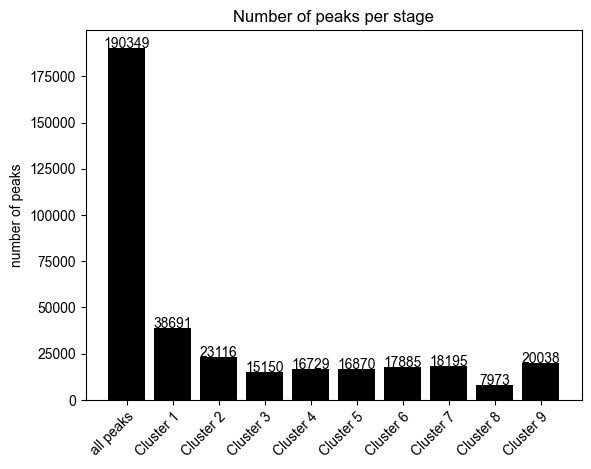

In [10]:
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, y[i], y[i], ha = 'center')

plt.bar(results_summed.keys(), results_summed.values(), color = 'k')
plt.xticks(rotation = 45, ha = 'right', rotation_mode = 'anchor')
addlabels(results_summed.keys(), list(results_summed.values()))

plt.title('Number of peaks per stage')
plt.ylabel('number of peaks')
plt.savefig('OmniATAC_numpeaks_percluster_new.svg')
plt.show()

{'all peaks': [0.182, 0.302, 0.07, 0.094, 0.062, 0.282, 0.008],
 'Cluster 1': [0.258, 0.283, 0.087, 0.104, 0.063, 0.201, 0.004],
 'Cluster 2': [0.404, 0.209, 0.074, 0.093, 0.054, 0.163, 0.003],
 'Cluster 3': [0.096, 0.312, 0.078, 0.088, 0.105, 0.316, 0.006],
 'Cluster 4': [0.073, 0.368, 0.054, 0.056, 0.065, 0.371, 0.012],
 'Cluster 5': [0.054, 0.352, 0.053, 0.077, 0.053, 0.398, 0.013],
 'Cluster 6': [0.051, 0.332, 0.057, 0.092, 0.067, 0.388, 0.015],
 'Cluster 7': [0.036, 0.359, 0.059, 0.094, 0.047, 0.391, 0.014],
 'Cluster 8': [0.58, 0.186, 0.041, 0.037, 0.019, 0.135, 0.003],
 'Cluster 9': [0.115, 0.294, 0.088, 0.157, 0.079, 0.261, 0.006]}

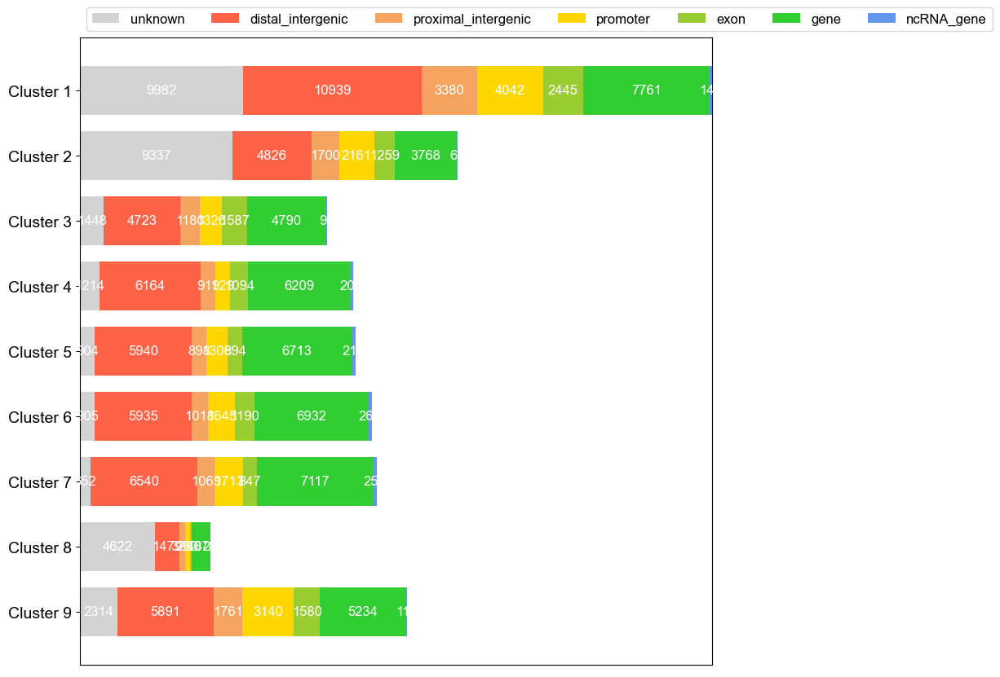

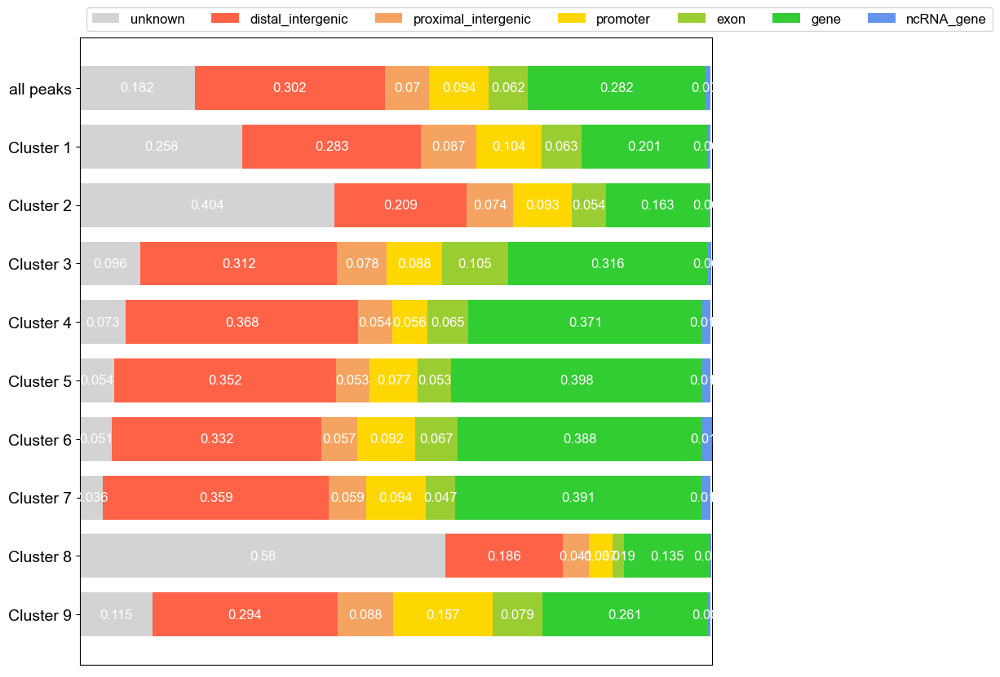

In [7]:
results_fraction = {}
for i in results_converted:
    results_fraction[i] = [np.round(j / sum(results_converted[i]), 3) for j in results_converted[i]]

display(results_fraction)

def survey(results, category_names):
    """
    Parameters
    ----------
    results : dict
        A mapping from question labels to a list of answers per category.
        It is assumed all lists contain the same number of entries and that
        it matches the length of *category_names*.
    category_names : list of str
        The category labels.
    """
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = ['lightgray', 'tomato', 'sandybrown', 'gold', 'yellowgreen', 'limegreen', 'cornflowerblue', 'mediumslateblue']

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    for i, (colname, color) in enumerate(zip(category_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        rects = ax.barh(labels, widths, left=starts, height=0.75,
                        label=colname, color=color)

        text_color = 'white'
        ax.bar_label(rects, label_type='center', color=text_color, fontsize = 12)
    ax.legend(ncol=len(category_names), bbox_to_anchor=(0, 1),
              loc='lower left', fontsize= 12)
    plt.yticks(fontsize = 14)

    return fig, ax

survey({i: results_converted[i] for i in results_converted if 'Cluster' in i}, category_names)
plt.show()

survey(results_fraction, category_names)
plt.savefig('Mfuzz_peaktypes_new.svg')
plt.show()